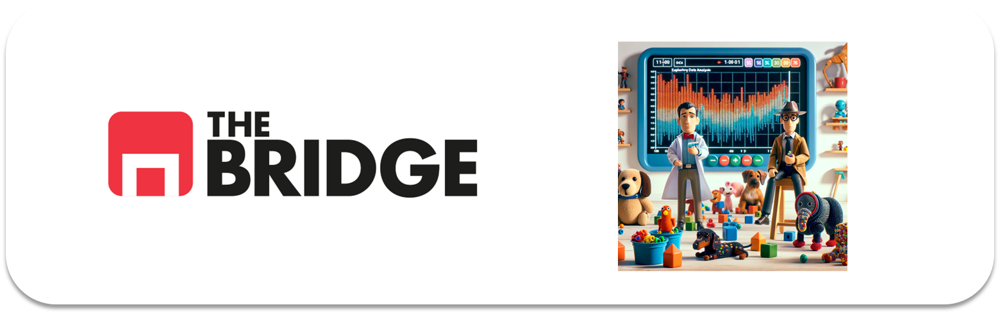

## PRACTICA OBLIGATORIA: ANÁLISIS MULTIVARIANTE

* La práctica obligatoria de esta unidad consiste en completar el análisis del dataset del Titanic, dirigido por una serie de preguntas, y de terminar de analizar algunos aspectos del dataset de viajes. Descarga este notebook en tu ordenador y trabaja en local. Ten en cuenta que tendrás que descar los directorios de imágenes y datos adicionales, si los hubiera.
* Recuerda que debes subirla a tu repositorio personal antes de la sesión en vivo para que puntúe adecuadamente.  
* Recuerda también que no es necesario que esté perfecta, sólo es necesario que se vea el esfuerzo. 
* Esta práctica se resolverá en la sesión en vivo correspondiente y la solución se publicará en el repo del curso. 

### Ejercicio 0


Importa los paquetes y módulos que necesites a lo largo del notebook

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import sys  
sys.path.insert(1, '/Users/lauragarcia/REPO_PRUEBA/ONLINE_DS_THEBRIDGE_Curso2025/03_Analisis_de_Datos/Sprint_07/Unidad_02/Practica_Obligatoria')

from bootcampviztools import plot_categorical_numerical_relationship, plot_combined_graphs, \
    pinta_distribucion_categoricas, plot_grouped_boxplots, plot_categorical_relationship_fin, plot_grouped_histograms, \
        grafico_dispersion_con_correlacion, bubble_plot


## #1 TITANIC

### #1.1

Carga en un dataframe el dataset del titanic, que está en la ruta "./data/titanic.csv".

In [15]:
df_titanic = pd.read_csv("/Users/lauragarcia/REPO_PRUEBA/ONLINE_DS_THEBRIDGE_Curso2025/03_Analisis_de_Datos/Sprint_07/Unidad_01/Practica_Obligatoria/data/titanic.csv")
df_titanic

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,yes,True


### #1.2

Deshazte de las columnas "deck", "survived", "pclass" y "embarked" porque no las emplearemos, la primera por su cantidad de nulos y el resto porque son variantes de otras que ya existen y cuyos valores resultan más expresivos a la hora de hacer un análisis. 

In [17]:
df_titanic_modif = df_titanic.drop("deck", axis = 1)
df_titanic_modif = df_titanic_modif.drop("survived", axis = 1)
df_titanic_modif = df_titanic_modif.drop("pclass", axis = 1)
df_titanic_modif = df_titanic_modif.drop("embarked", axis = 1)
df_titanic_modif

,sex,age,sibsp,parch,fare,class,who,adult_male,embark_town,alive,alone
0,male,22.0,1,0,7.2500,Third,man,True,Southampton,no,False
1,female,38.0,1,0,71.2833,First,woman,False,Cherbourg,yes,False
2,female,26.0,0,0,7.9250,Third,woman,False,Southampton,yes,True
3,female,35.0,1,0,53.1000,First,woman,False,Southampton,yes,False
4,male,35.0,0,0,8.0500,Third,man,True,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...
886,male,27.0,0,0,13.0000,Second,man,True,Southampton,no,True
887,female,19.0,0,0,30.0000,First,woman,False,Southampton,yes,True
888,female,NaN,1,2,23.4500,Third,woman,False,Southampton,no,False
889,male,26.0,0,0,30.0000,First,man,True,Cherbourg,yes,True


### #1.3

Suma las columnas "parch" y "sibsp" para tener el número de parientes de cada pasajero, guarda el resultado en otra columna "family_members", luego deshazte de "parch" y "sibsp"

In [18]:
df_titanic_modif["family_members"] = df_titanic_modif["parch"] + df_titanic_modif["sibsp"]
df_titanic_modif

,sex,age,sibsp,parch,fare,class,who,adult_male,embark_town,alive,alone,family_members
0,male,22.0,1,0,7.2500,Third,man,True,Southampton,no,False,1
1,female,38.0,1,0,71.2833,First,woman,False,Cherbourg,yes,False,1
2,female,26.0,0,0,7.9250,Third,woman,False,Southampton,yes,True,0
3,female,35.0,1,0,53.1000,First,woman,False,Southampton,yes,False,1
4,male,35.0,0,0,8.0500,Third,man,True,Southampton,no,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...
886,male,27.0,0,0,13.0000,Second,man,True,Southampton,no,True,0
887,female,19.0,0,0,30.0000,First,woman,False,Southampton,yes,True,0
888,female,NaN,1,2,23.4500,Third,woman,False,Southampton,no,False,3
889,male,26.0,0,0,30.0000,First,man,True,Cherbourg,yes,True,0


### #1.4

Imputa la moda a los valores nulos de "embark_town"

In [19]:
df_titanic_modif["emabark_town"] = df_titanic_modif["embark_town"].fillna( df_titanic_modif["embark_town"].mode())
df_titanic_modif

,sex,age,sibsp,parch,fare,class,who,adult_male,embark_town,alive,alone,family_members,emabark_town
0,male,22.0,1,0,7.2500,Third,man,True,Southampton,no,False,1,Southampton
1,female,38.0,1,0,71.2833,First,woman,False,Cherbourg,yes,False,1,Cherbourg
2,female,26.0,0,0,7.9250,Third,woman,False,Southampton,yes,True,0,Southampton
3,female,35.0,1,0,53.1000,First,woman,False,Southampton,yes,False,1,Southampton
4,male,35.0,0,0,8.0500,Third,man,True,Southampton,no,True,0,Southampton
...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,male,27.0,0,0,13.0000,Second,man,True,Southampton,no,True,0,Southampton
887,female,19.0,0,0,30.0000,First,woman,False,Southampton,yes,True,0,Southampton
888,female,NaN,1,2,23.4500,Third,woman,False,Southampton,no,False,3,Southampton
889,male,26.0,0,0,30.0000,First,man,True,Cherbourg,yes,True,0,Cherbourg


### #1.5

Imputa la media a los valores faltantes de "age", si quieres puedes hacer algo más preciso (por ejemplo considerando además la columna "who")

In [20]:
es_mujer = df_titanic_modif.who == "woman"
es_hombre = df_titanic_modif.who == "man"
es_ninio = df_titanic_modif.who == "child" 

media_mujer = df_titanic_modif.loc[es_mujer, "age"].mean()
media_hombre = df_titanic_modif.loc[es_hombre, "age"].mean()
media_ninio = df_titanic_modif.loc[es_ninio, "age"].mean()

es_edad_nulo = df_titanic_modif.age.isna()

df_titanic_modif.loc[es_mujer & es_edad_nulo, "age"] = media_mujer
df_titanic_modif.loc[es_hombre & es_edad_nulo, "age"] = media_hombre
df_titanic_modif.loc[es_ninio & es_edad_nulo, "age"] = media_ninio

df_titanic_modif

,sex,age,sibsp,parch,fare,class,who,adult_male,embark_town,alive,alone,family_members,emabark_town
0,male,22.0,1,0,7.2500,Third,man,True,Southampton,no,False,1,Southampton
1,female,38.0,1,0,71.2833,First,woman,False,Cherbourg,yes,False,1,Cherbourg
2,female,26.0,0,0,7.9250,Third,woman,False,Southampton,yes,True,0,Southampton
3,female,35.0,1,0,53.1000,First,woman,False,Southampton,yes,False,1,Southampton
4,male,35.0,0,0,8.0500,Third,man,True,Southampton,no,True,0,Southampton
...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,male,27.0,0,0,13.0000,Second,man,True,Southampton,no,True,0,Southampton
887,female,19.0,0,0,30.0000,First,woman,False,Southampton,yes,True,0,Southampton
888,female,32.0,1,2,23.4500,Third,woman,False,Southampton,no,False,3,Southampton
889,male,26.0,0,0,30.0000,First,man,True,Cherbourg,yes,True,0,Cherbourg


### 1.6

Realiza los análisis bivariantes o multivariantes que necesites, así como los test de hipótesis necesarios para contestar a las siguientes preguntas. Nota: utiliza la variable "alive" para saber si un pasajero sobrevivió o no:

1. En términos absolutos, ¿sobrevivieron más hombres, mujeres o niños? ¿Y en términos relativos? ¿Existe alguna relación estadísticamente significativa entre el sexo y la supervivencia en el Titanic?¿Y entre ser adulto o ser niño?

2. En términos absolutos, ¿de que clase sobrevivieron más pasajeros?¿ Y en términos relativos? ¿Existe alguna relación estadísticamente significativa entre la clase en la que se viajaba y la supervivencia?

3. ¿De qué ciudad sobrevivieron más personas?¿Y porcentualmente de que ciudad sobrevivieron más personas? ¿Hay alguna relación estadística significativa entre haber embarcado en una de las tres ciudades y haber sobrevivido o fallecido?

4. ¿Qué relación hay entre el precio del pasaje y la supervivencia/fallecimiento?

5. Existen pasajero que no pagaron el billete, ¿podrías explicar por qué? ¿Qué ocurrió con la persona que más dinero se dejó?

6. Existe alguna relación entre el dinero pagado, la ciudad de embarque y la superviviencia/fallecimiento. No necesitas aplicar ningún test, muestralo numérica o visualmente.

7. Ahondando en la relación entre sobrevivir o fallecer, la clase en la que se viajó y la edad de los pasajeros. ¿Qué agrupación de las dos variables (clase y edad) sobrevivió más en términos absolutos y en términos relativos?

8. Finalmente, muestra las posibles relaciones entre edad, coste del billete y supervivencia/fallecimiento. ¿Qué puedes decir al respecto?

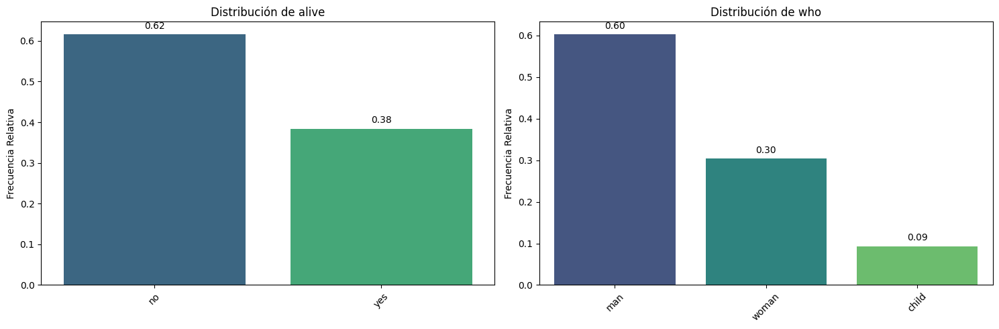

In [22]:
pinta_distribucion_categoricas(df_titanic_modif,["alive","who"], relativa= True, mostrar_valores= True)

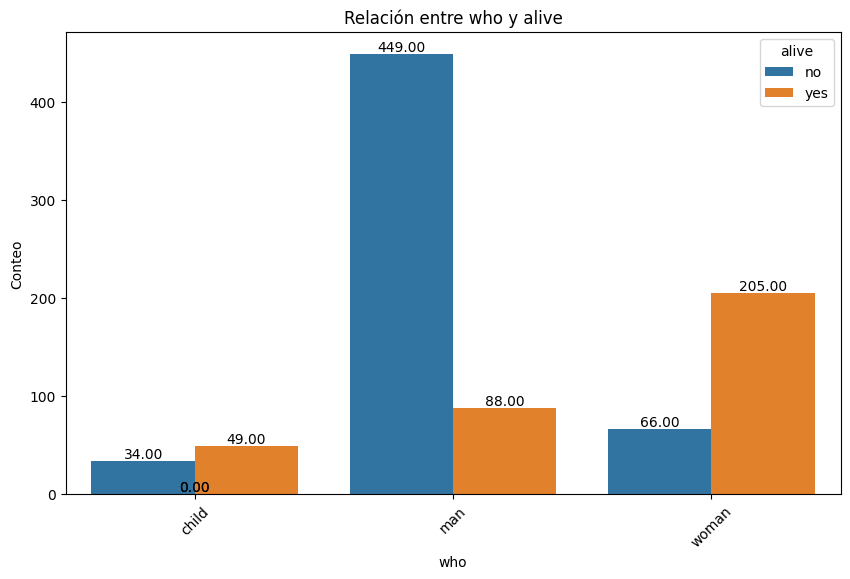

In [23]:
plot_categorical_relationship_fin(df_titanic_modif, "who","alive", show_values= True)

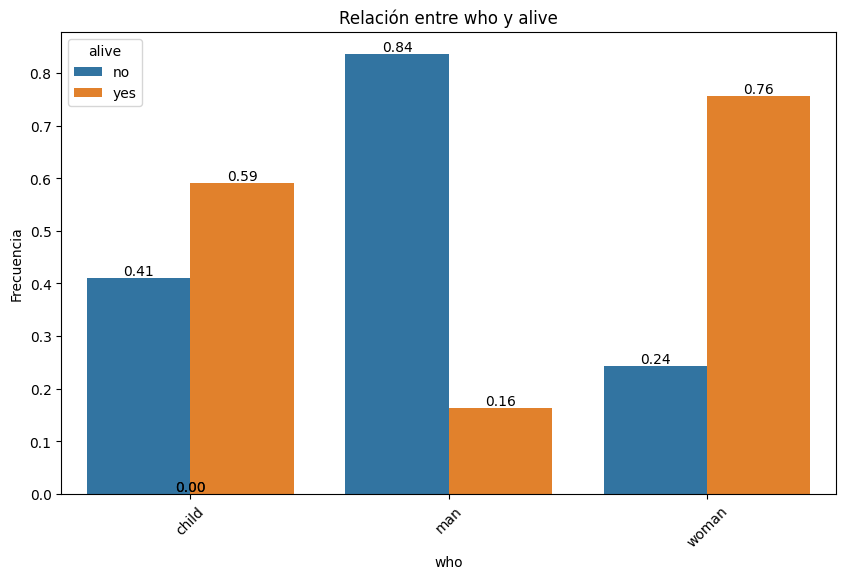

In [24]:
plot_categorical_relationship_fin(df_titanic_modif, "who","alive", relative_freq = True, show_values = True)

In [25]:
df_titanic_modif.groupby("who", as_index = False)["alive"].value_counts(normalize = True)

,who,alive,proportion
0,child,yes,0.590361
1,child,no,0.409639
2,man,no,0.836127
3,man,yes,0.163873
4,woman,yes,0.756458
5,woman,no,0.243542


Parece que sobrevivieron más mujeres y niños que hombres.

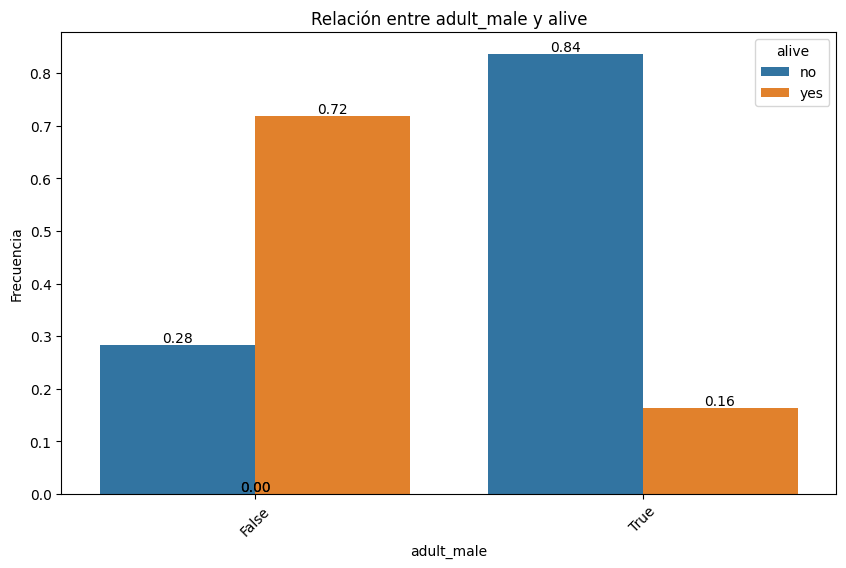

In [26]:
plot_categorical_relationship_fin(df_titanic_modif, "adult_male","alive", relative_freq = True, show_values = True)

Y entre adultos y niños, parece que sobrevivieron más los jóvenes que los adultos.

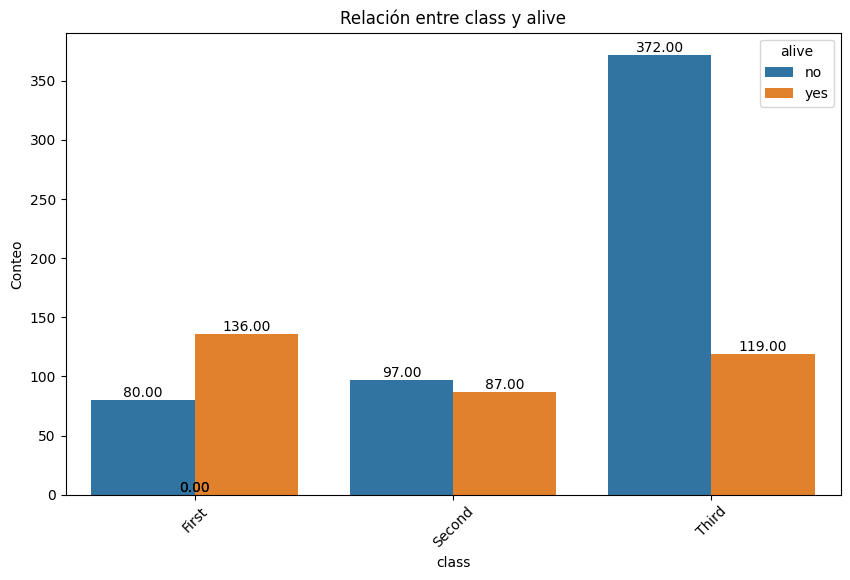

In [27]:
plot_categorical_relationship_fin(df_titanic_modif, "class","alive", show_values= True)

In [28]:
df_titanic_modif.groupby("class", as_index = False)["alive"].value_counts(normalize = True)

,class,alive,proportion
0,First,yes,0.629630
1,First,no,0.370370
2,Second,no,0.527174
3,Second,yes,0.472826
4,Third,no,0.757637
5,Third,yes,0.242363


In [29]:
tabla_contingencia = pd.crosstab(df_titanic_modif['alive'], df_titanic_modif['class'])


tabla_contingencia

class,First,Second,Third
alive,,,
no,80,97,372
yes,136,87,119


In [30]:
from scipy.stats import chi2_contingency


chi2, p, dof, expected = chi2_contingency(tabla_contingencia)


print("Valor Chi-Cuadrado:", chi2)
print("P-Value:", p)
print("Grados de Libertad:", dof)
print("Tabla de Frecuencias Esperadas:\n", expected)

Valor Chi-Cuadrado: 102.88898875696056
P-Value: 4.549251711298793e-23
Grados de Libertad: 2
Tabla de Frecuencias Esperadas:
 [[133.09090909 113.37373737 302.53535354]
 [ 82.90909091  70.62626263 188.46464646]]


En relación a los datos y al valor de p, podemos decir que existe una relación entre la clase y la supervivencia. En la que podemos ver que sobrevivieron más personas de primera clase. De segunda, andan similares, pero de tercera sobrervivieron pocos.

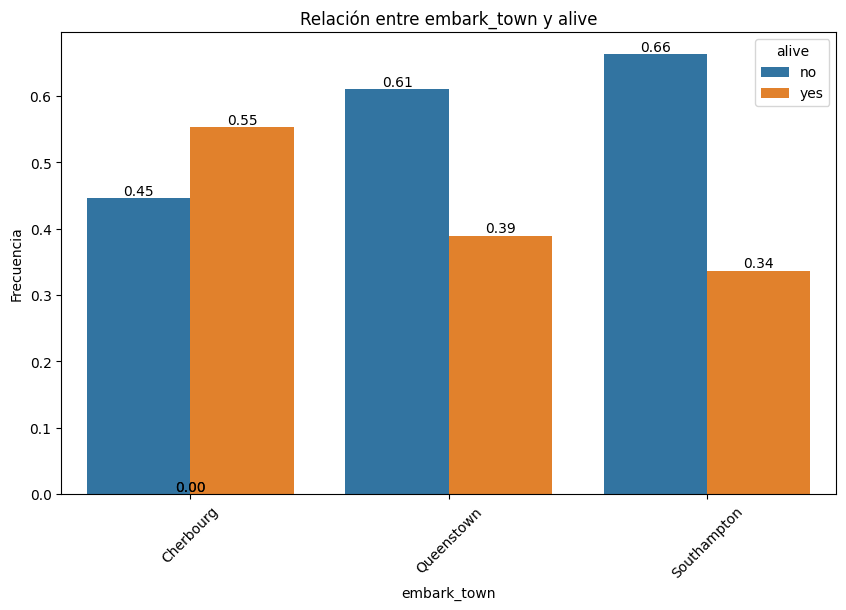

In [34]:
plot_categorical_relationship_fin(df_titanic_modif, "embark_town","alive", relative_freq = True, show_values = True)

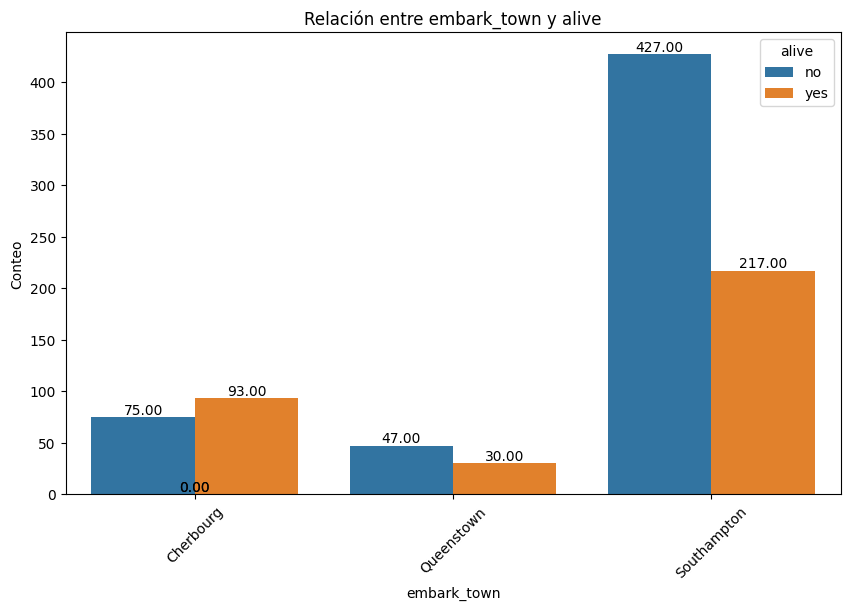

In [31]:
plot_categorical_relationship_fin(df_titanic_modif, "embark_town","alive", show_values= True)

In [32]:
tabla_contingencia = pd.crosstab(df_titanic_modif['alive'], df_titanic_modif['embark_town'])

from scipy.stats import chi2_contingency


chi2, p, dof, expected = chi2_contingency(tabla_contingencia)


print("Valor Chi-Cuadrado:", chi2)
print("P-Value:", p)
print("Grados de Libertad:", dof)
print("Tabla de Frecuencias Esperadas:\n", expected)


Valor Chi-Cuadrado: 26.48914983923762
P-Value: 1.769922284120912e-06
Grados de Libertad: 2
Tabla de Frecuencias Esperadas:
 [[103.7480315  47.5511811 397.7007874]
 [ 64.2519685  29.4488189 246.2992126]]


Según los datos estadisticos, existe una relación entre el lugar de embarque y la supervivencia. Los que embarcarron en Cherbourg sobrevivieron más que los que montaron en Southamptom.

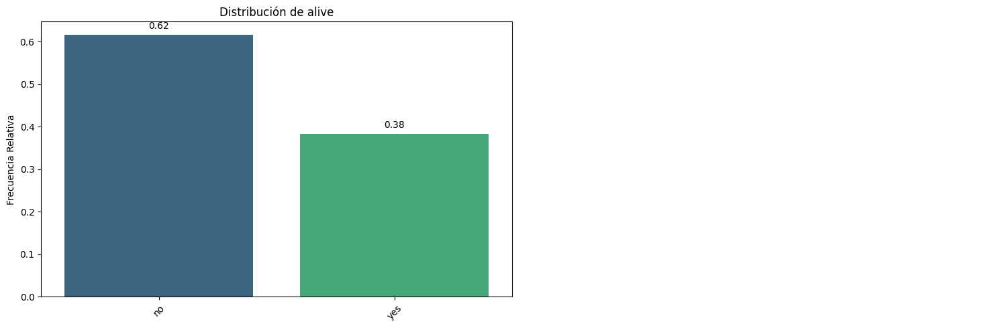

In [35]:
pinta_distribucion_categoricas(df_titanic_modif,["alive"], relativa= True, mostrar_valores= True)

(2,)


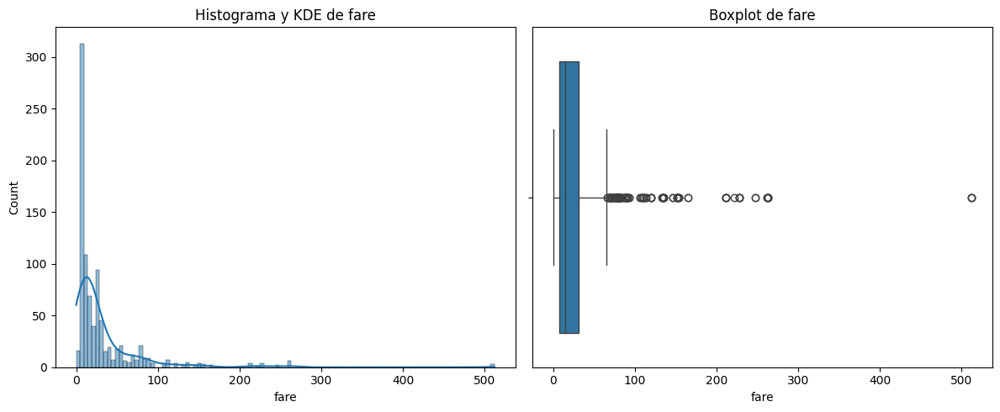

In [36]:
plot_combined_graphs(df_titanic_modif,["fare"])

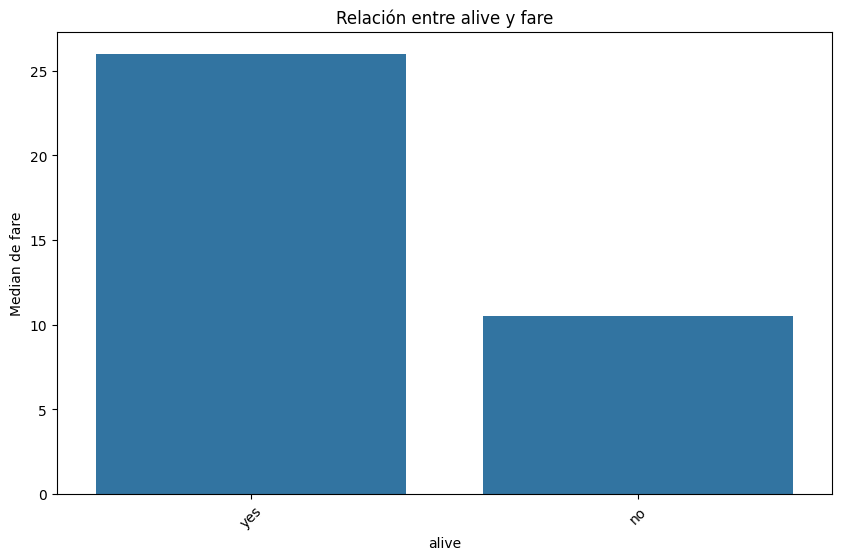

In [37]:
plot_categorical_numerical_relationship(df_titanic_modif,"alive","fare", measure = "median")

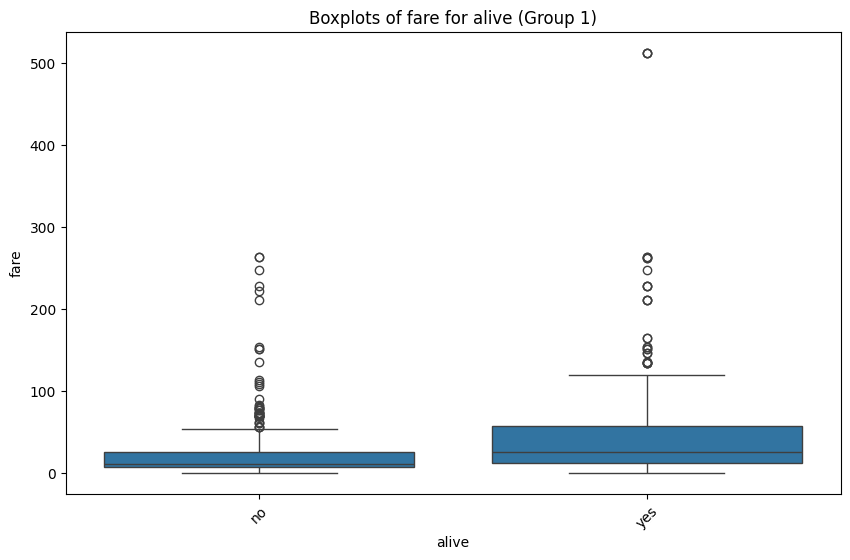

In [38]:
plot_grouped_boxplots(df_titanic_modif,"alive","fare")

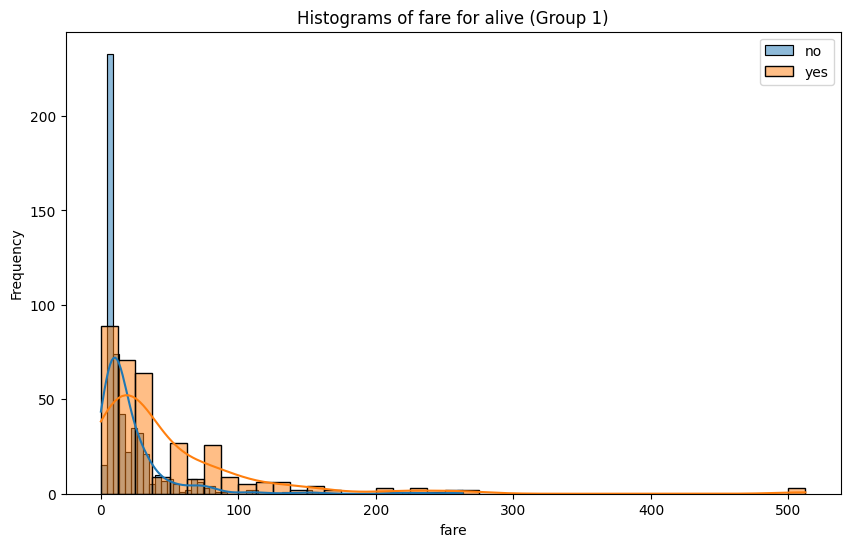

In [39]:
plot_grouped_histograms(df_titanic_modif,"alive", "fare", 2)

No parece haber demasiada relación entre los precios de los pasajes y la supervivencia.

In [41]:
#El hecho de que hubo personas que no pagasen, no se me ocurre el motivo, o puede que se colasen.
#Busco qué pasó con la persona que pagó más.
df_titanic_modif['fare'].max()
df_titanic_modif.loc[df_titanic_modif['fare']==512.3292]

,sex,age,sibsp,parch,fare,class,who,adult_male,embark_town,alive,alone,family_members,emabark_town
258,female,35.0,0,0,512.3292,First,woman,False,Cherbourg,yes,True,0,Cherbourg
679,male,36.0,0,1,512.3292,First,man,True,Cherbourg,yes,False,1,Cherbourg
737,male,35.0,0,0,512.3292,First,man,True,Cherbourg,yes,True,0,Cherbourg


Las tres personas que más pagaron por su viaje, embarcaron en Cherbourg y las tres sobrevivieron

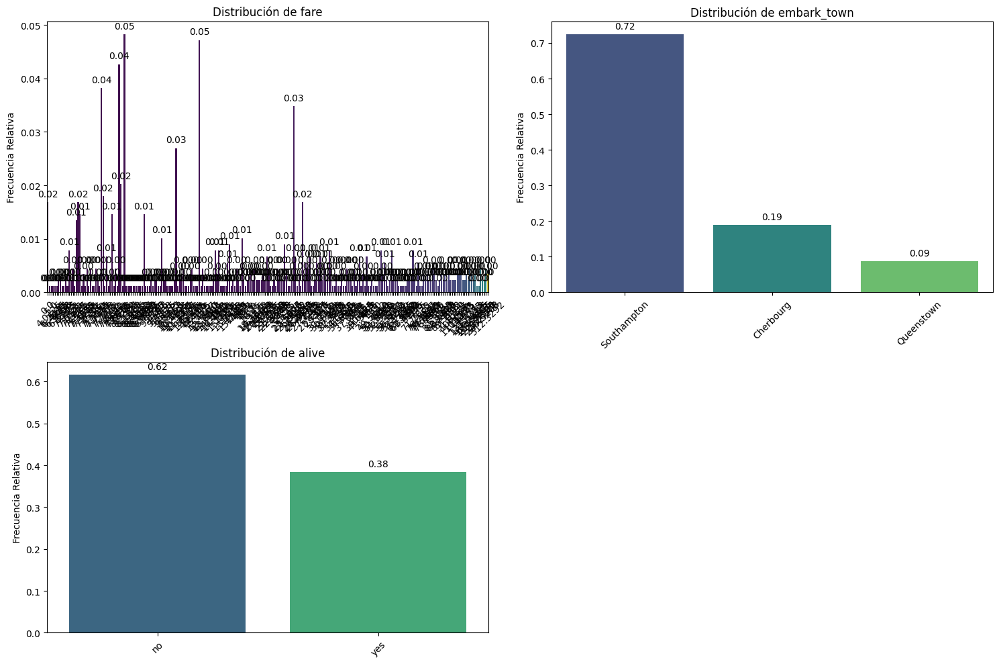

In [42]:
pinta_distribucion_categoricas(df_titanic_modif,["fare","embark_town","alive"], relativa= True, mostrar_valores= True)

In [46]:
columnas = ["alive","embark_town","fare"] 
col_directora = "alive"
col_1 = [col for col in columnas if col != col_directora][0]
col_2 = [col for col in columnas if col != col_directora][1]
diccionario_multivariante = {}
for valor in df_titanic_modif[col_directora].unique():
    diccionario_multivariante[valor] = df_titanic_modif.loc[df_titanic_modif[col_directora] == valor,[col_2,col_1]]

Supervivencia no:


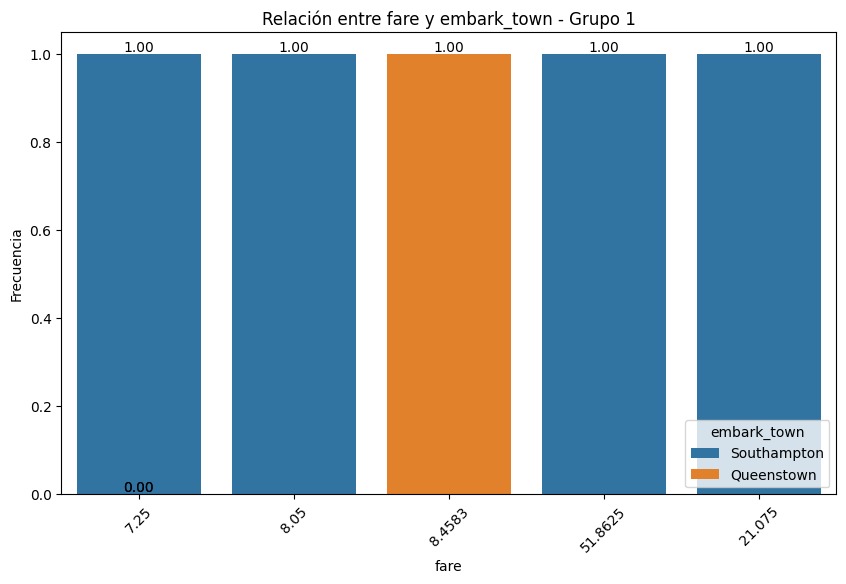

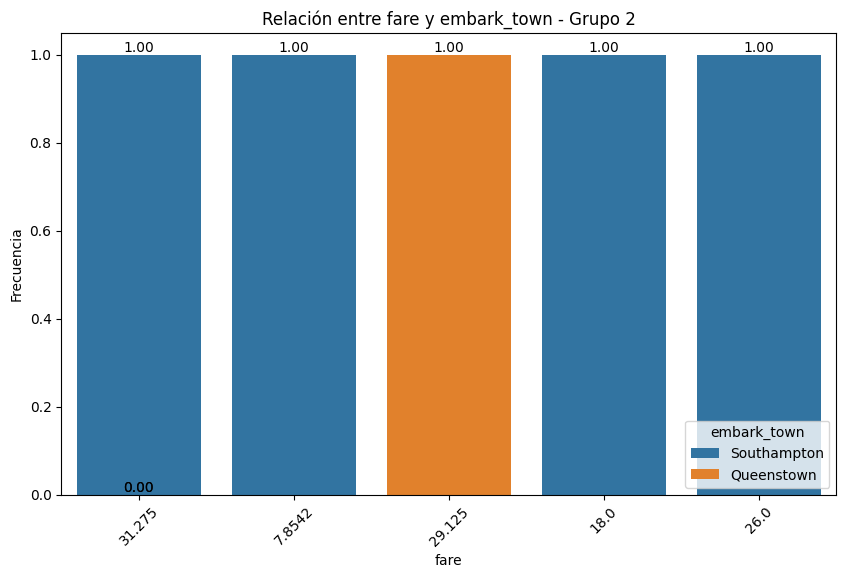

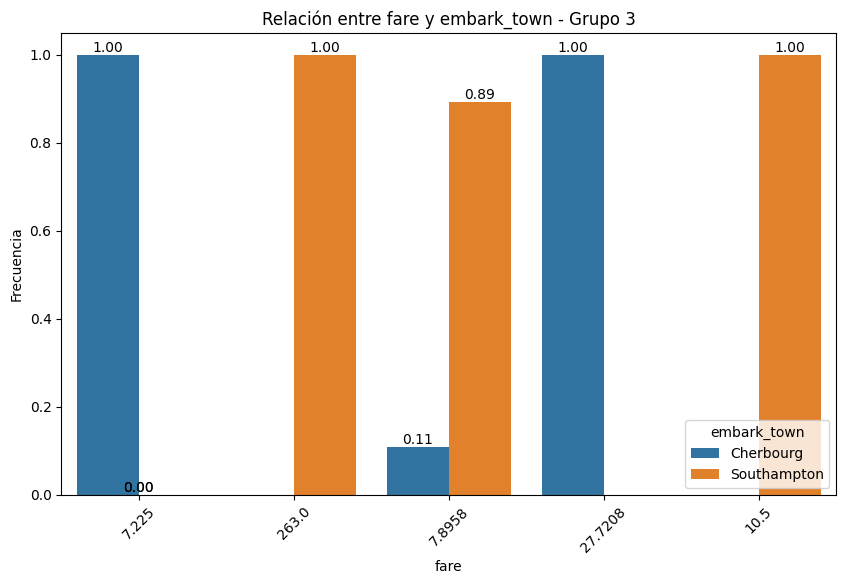

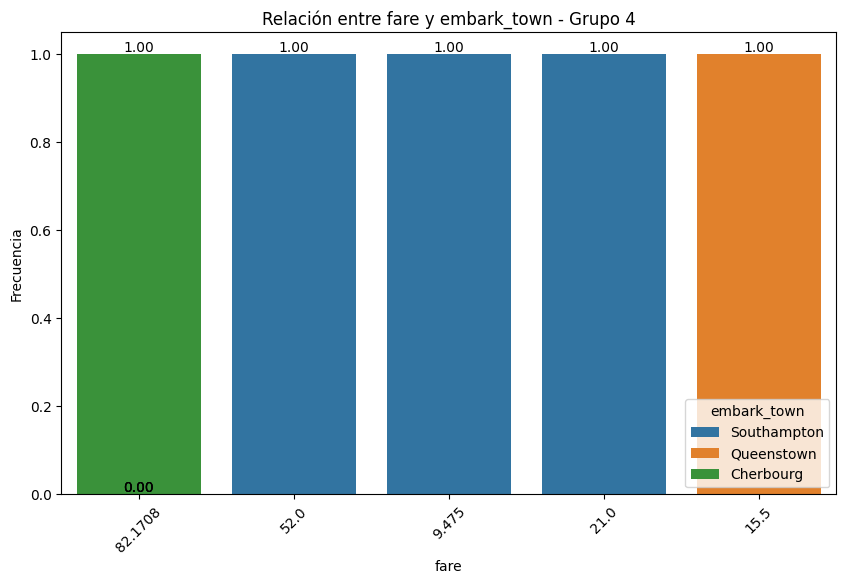

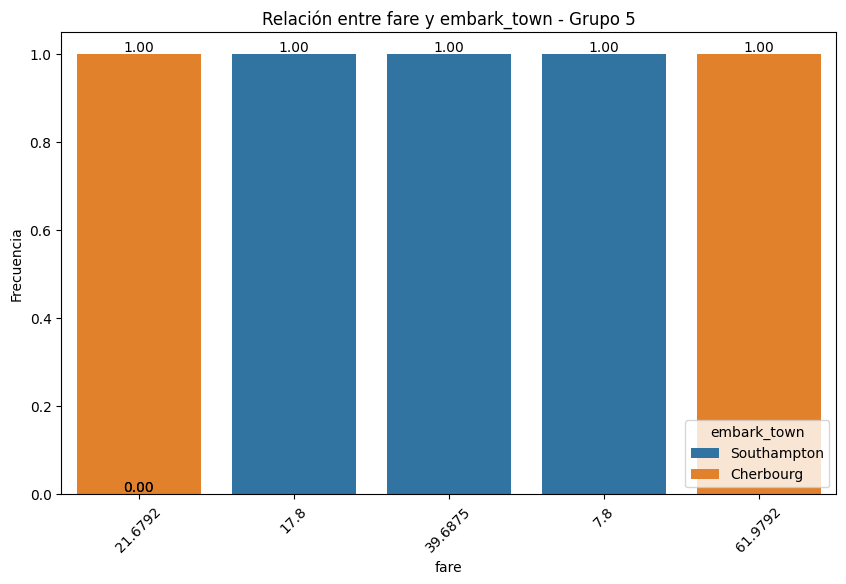

...

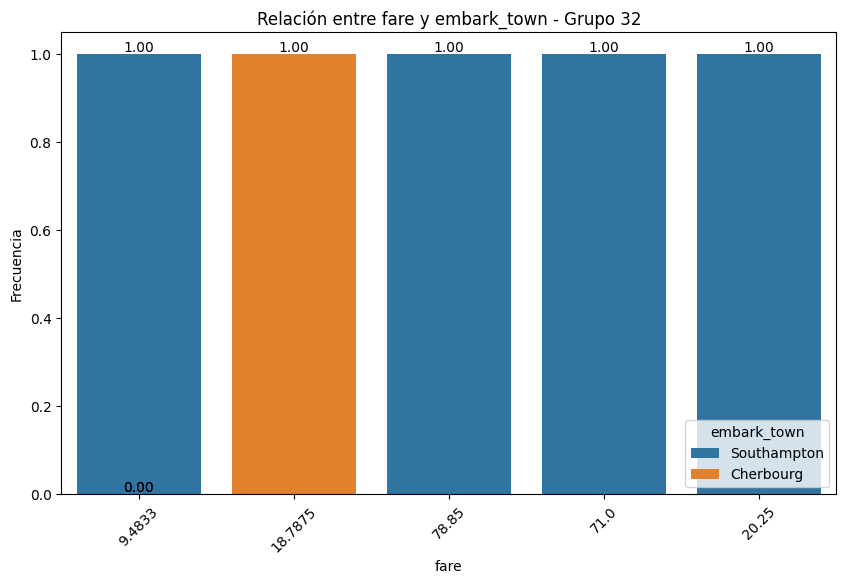

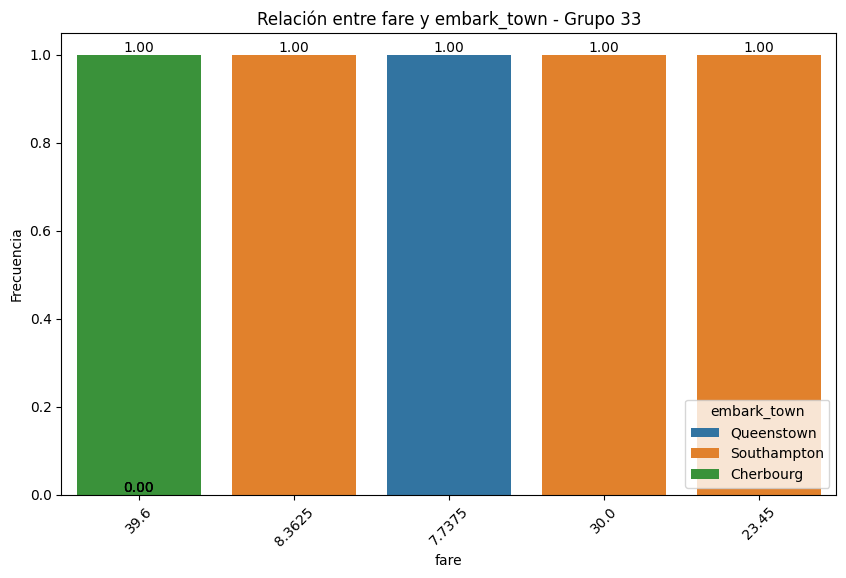

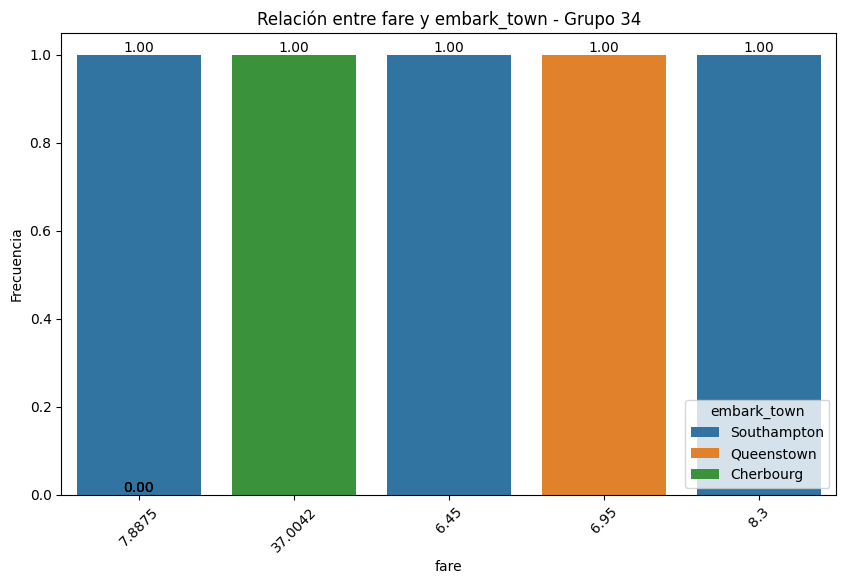

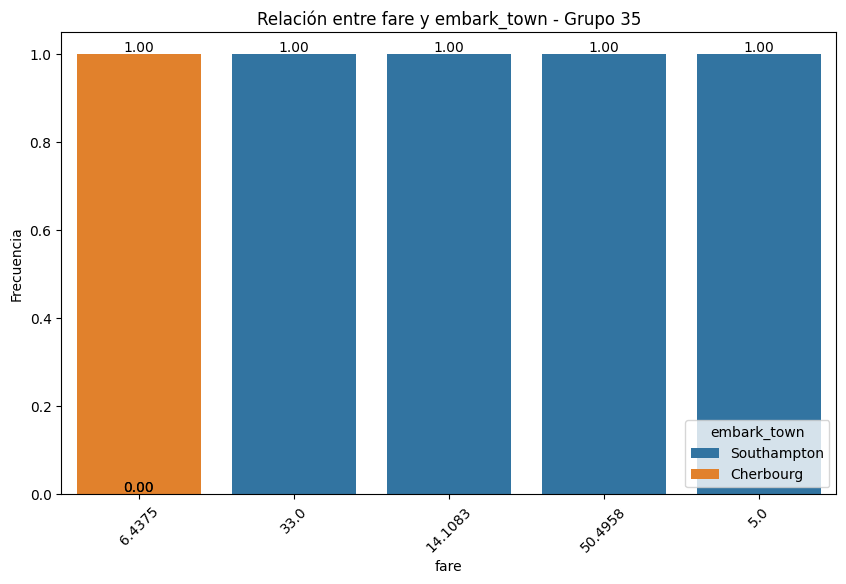

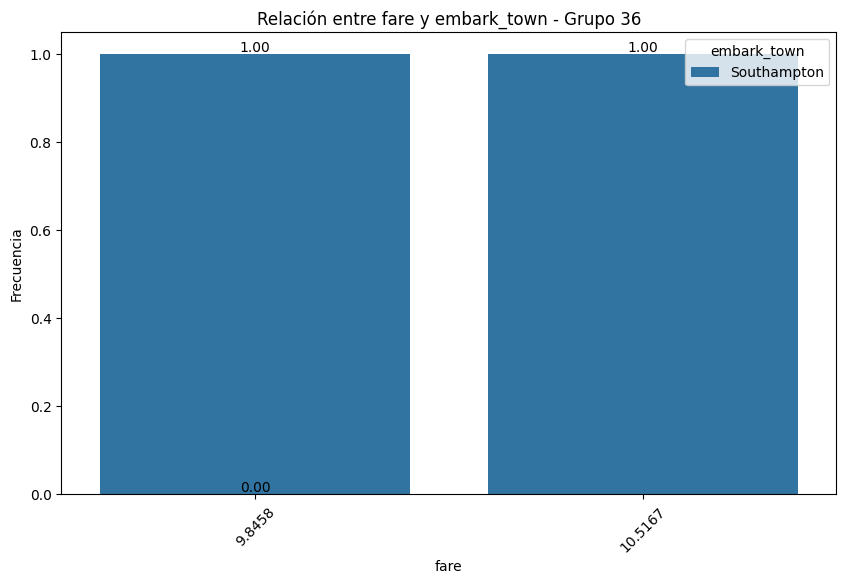

Supervivencia yes:


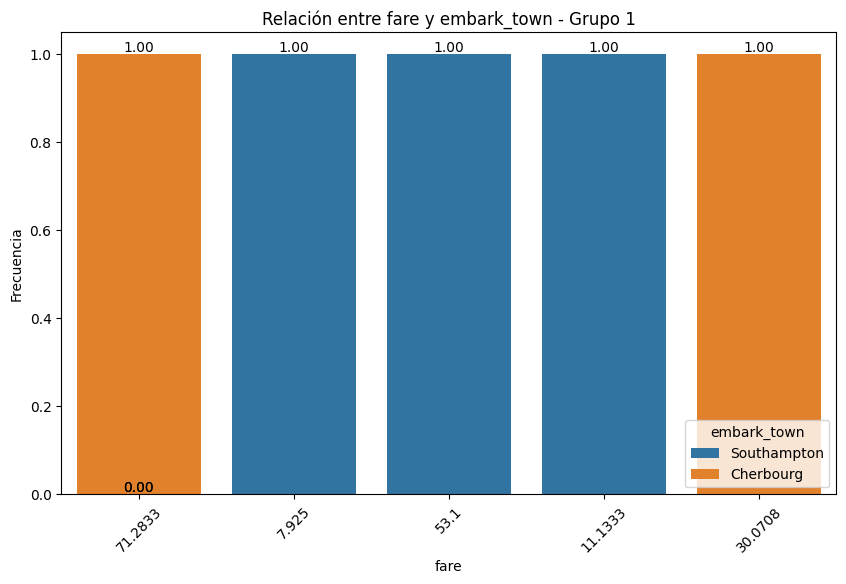

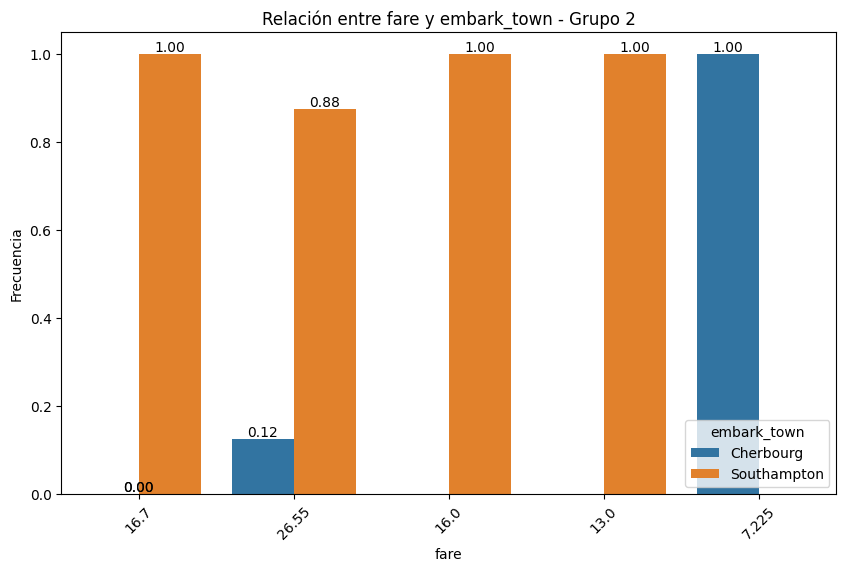

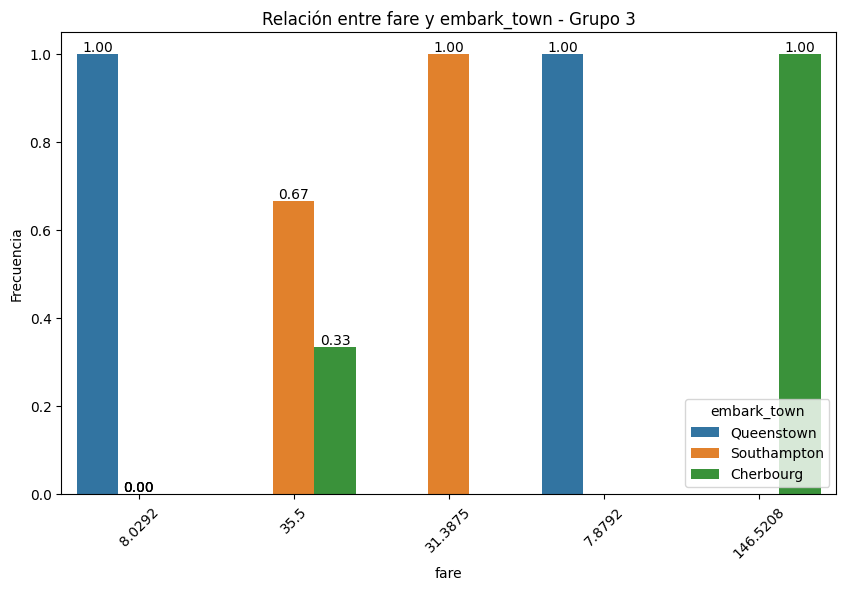

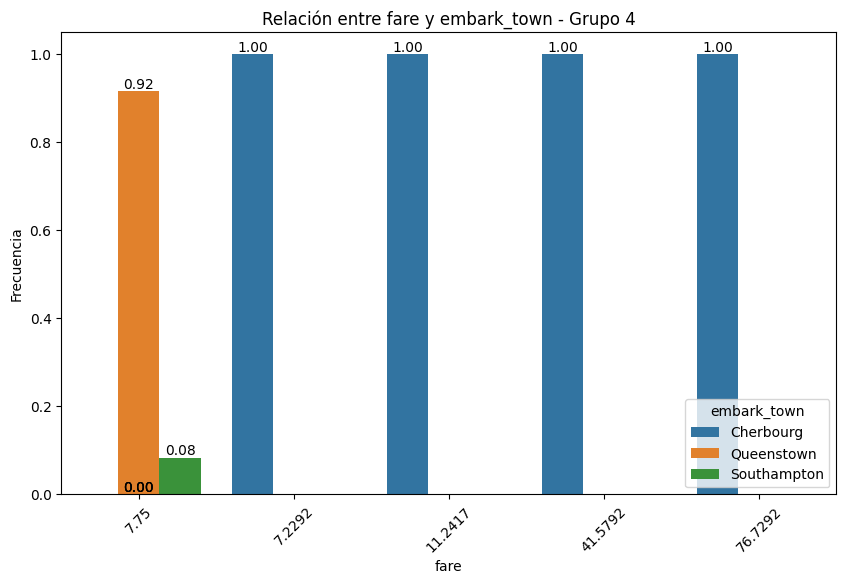

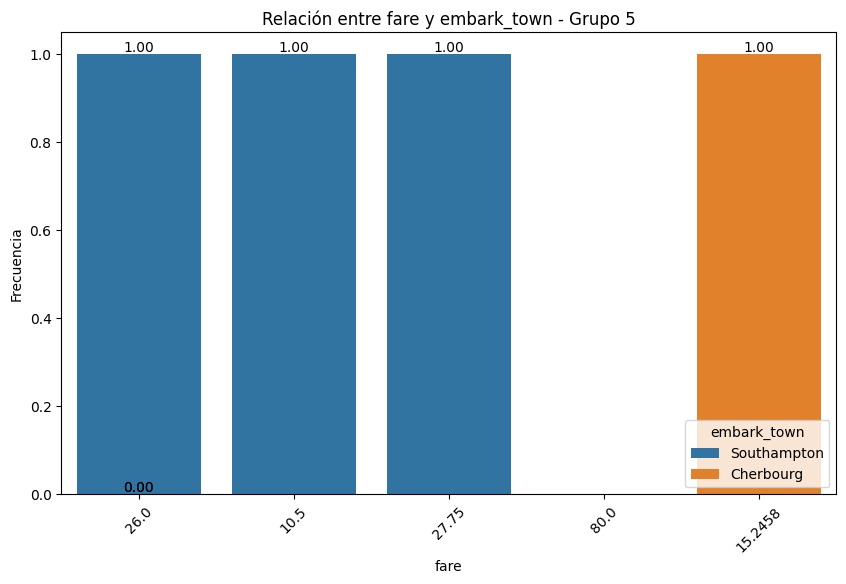

...

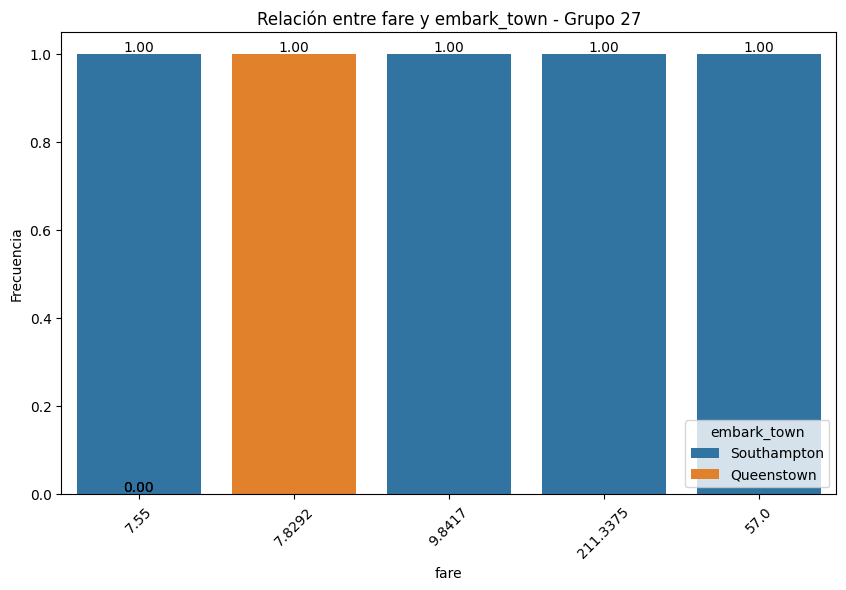

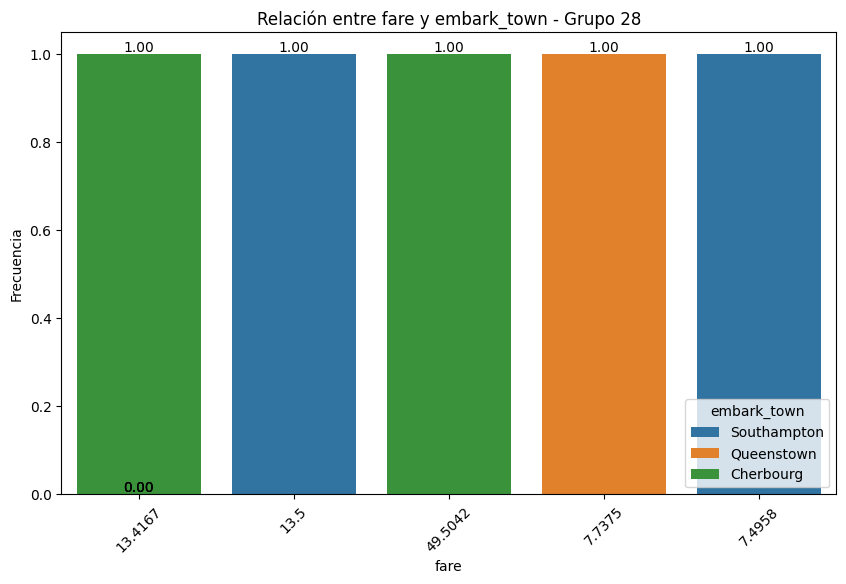

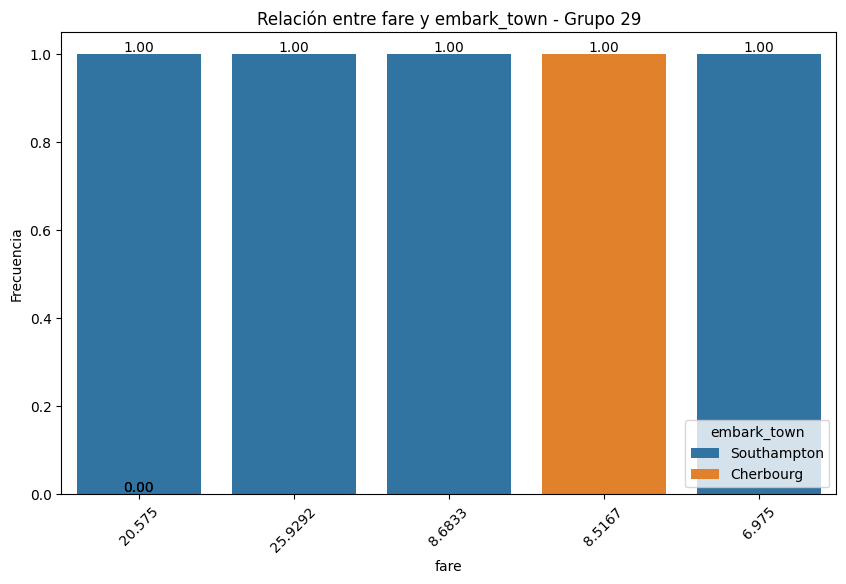

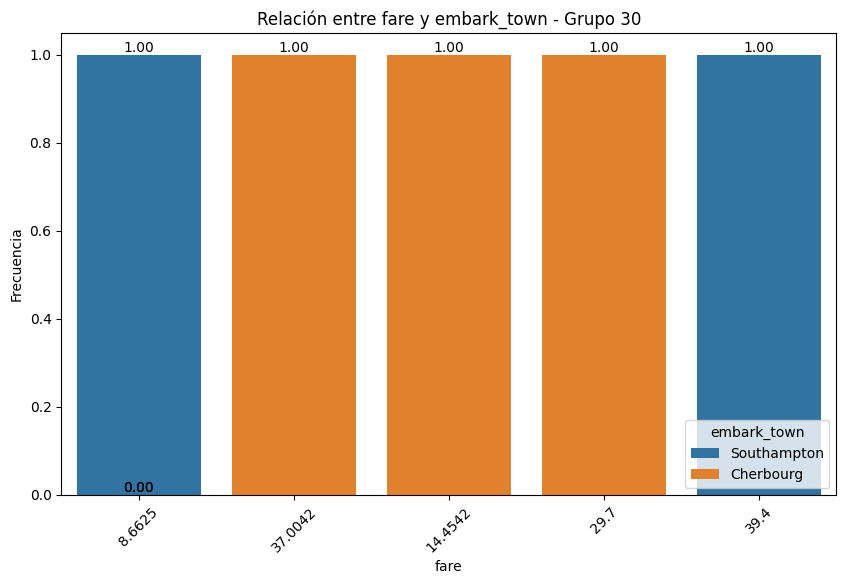

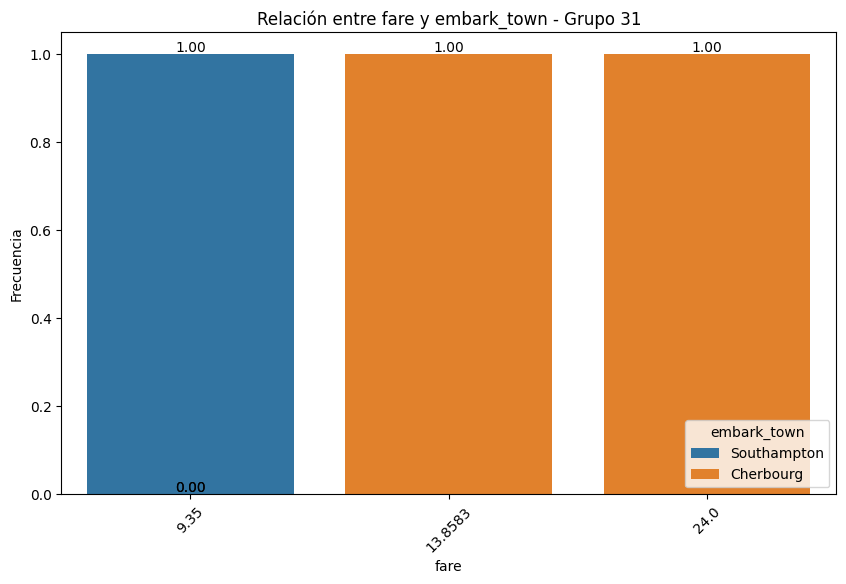

In [47]:
for valor,df_datos in diccionario_multivariante.items():
    print(f"Supervivencia {valor}:")
    plot_categorical_relationship_fin(df_datos,col_2,col_1, relative_freq= True, show_values= True)

In [49]:
columnas = ["alive","age","class"] 
col_directora = "alive"
col_1 = [col for col in columnas if col != col_directora][0]
col_2 = [col for col in columnas if col != col_directora][1]
diccionario_multivariante = {}
for valor in df_titanic_modif[col_directora].unique():
    diccionario_multivariante[valor] = df_titanic_modif.loc[df_titanic_modif[col_directora] == valor,[col_2,col_1]]

Supervivencia no:


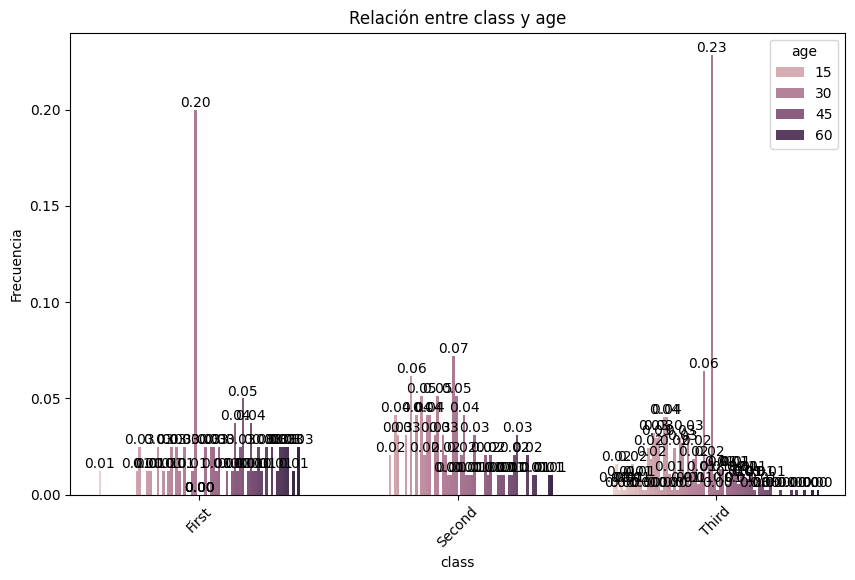

Supervivencia yes:


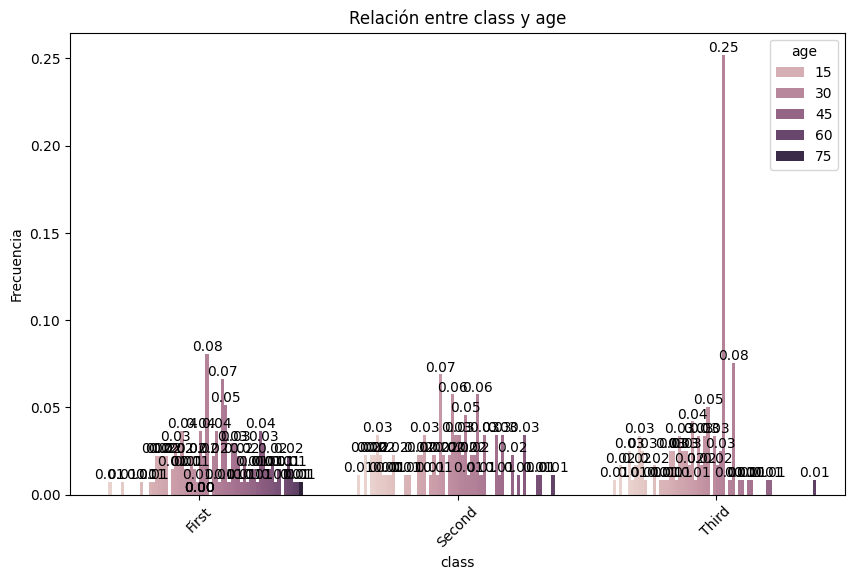

In [50]:
for valor,df_datos in diccionario_multivariante.items():
    print(f"Supervivencia {valor}:")
    plot_categorical_relationship_fin(df_datos,col_2,col_1, relative_freq= True, show_values= True)

In [52]:
columnas = ["alive","age","fare"] 
col_directora = "alive"
col_1 = [col for col in columnas if col != col_directora][0]
col_2 = [col for col in columnas if col != col_directora][1]
diccionario_multivariante = {}
for valor in df_titanic_modif[col_directora].unique():
    diccionario_multivariante[valor] = df_titanic_modif.loc[df_titanic_modif[col_directora] == valor,[col_2,col_1]]

Supervivencia no:


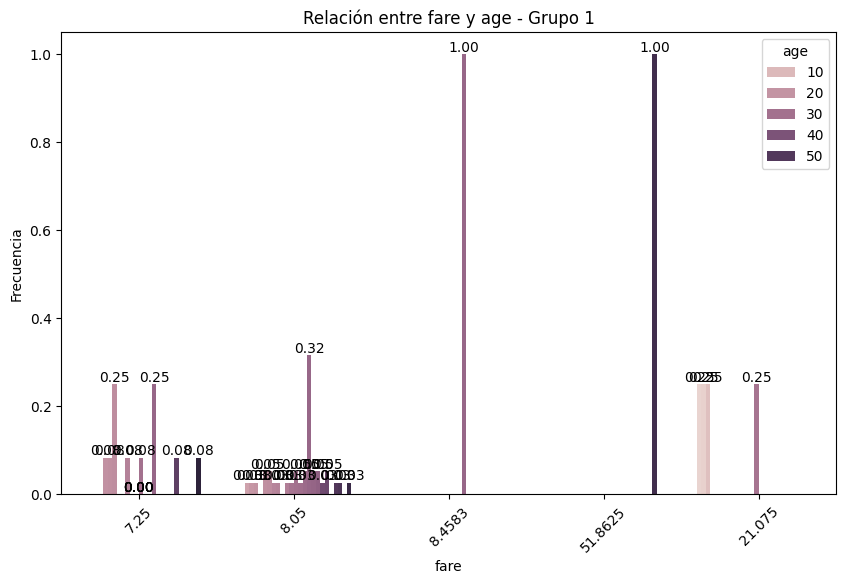

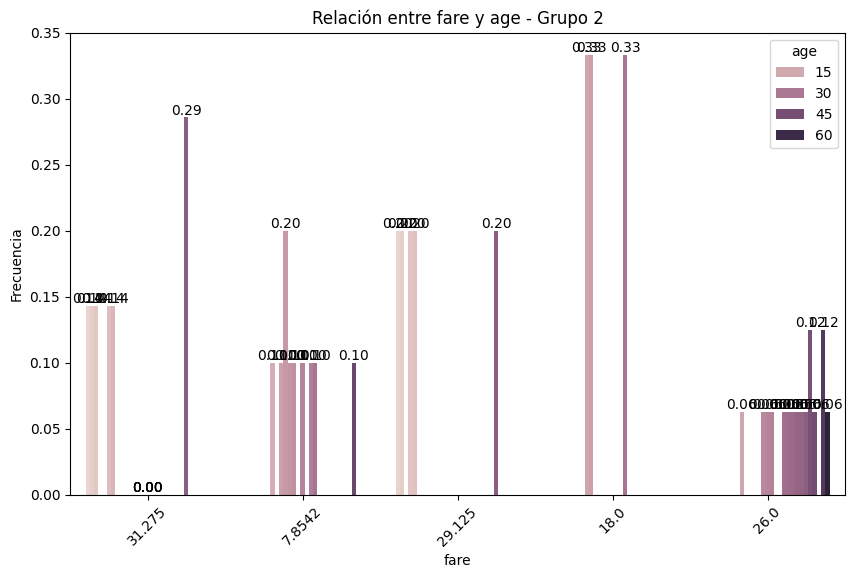

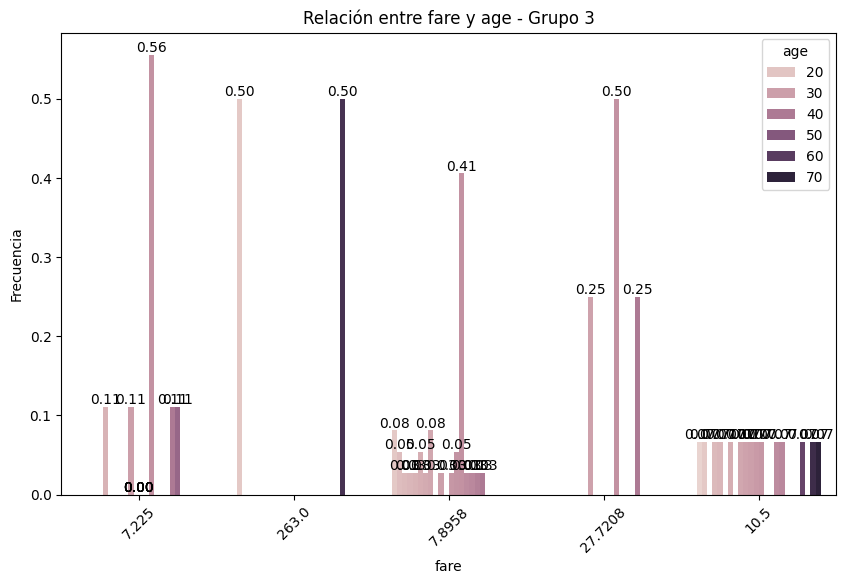

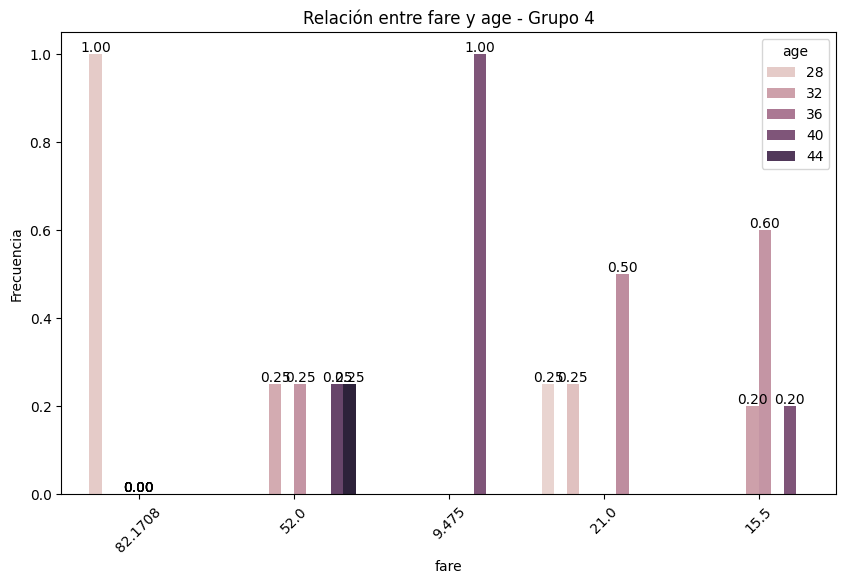

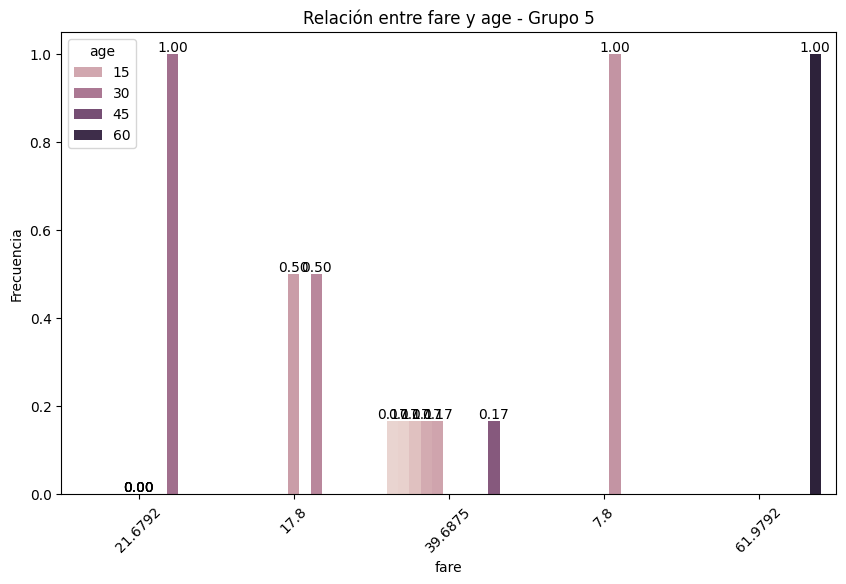

...

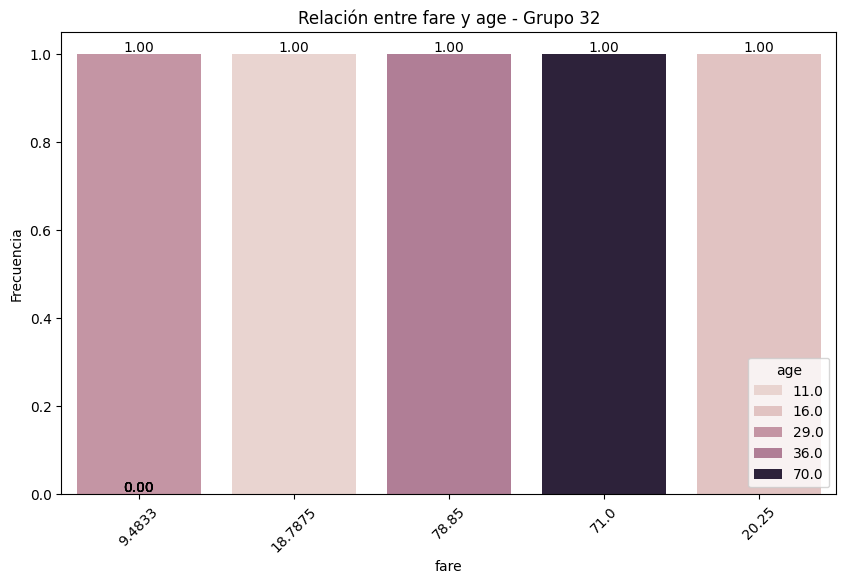

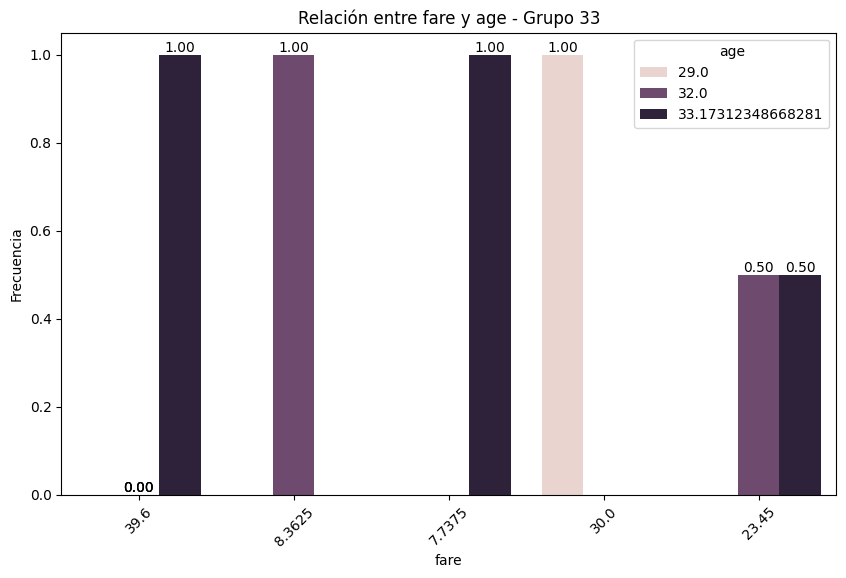

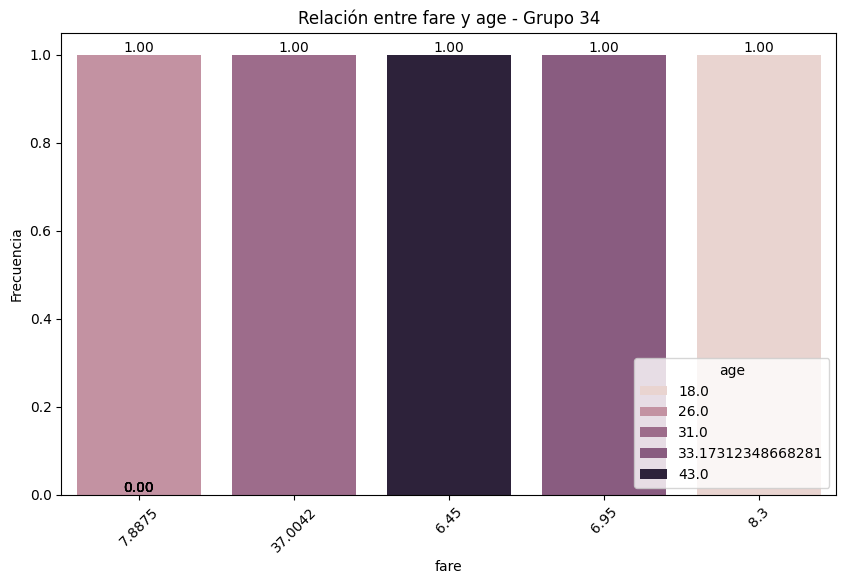

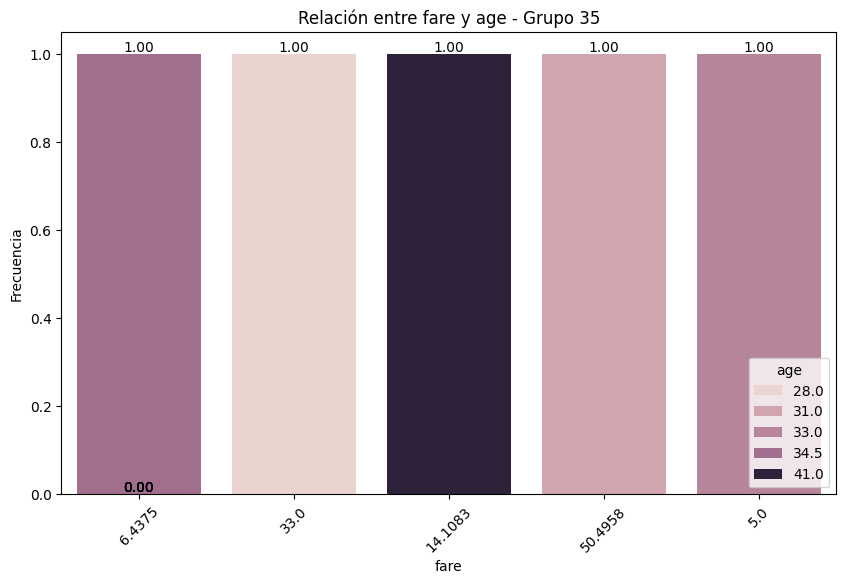

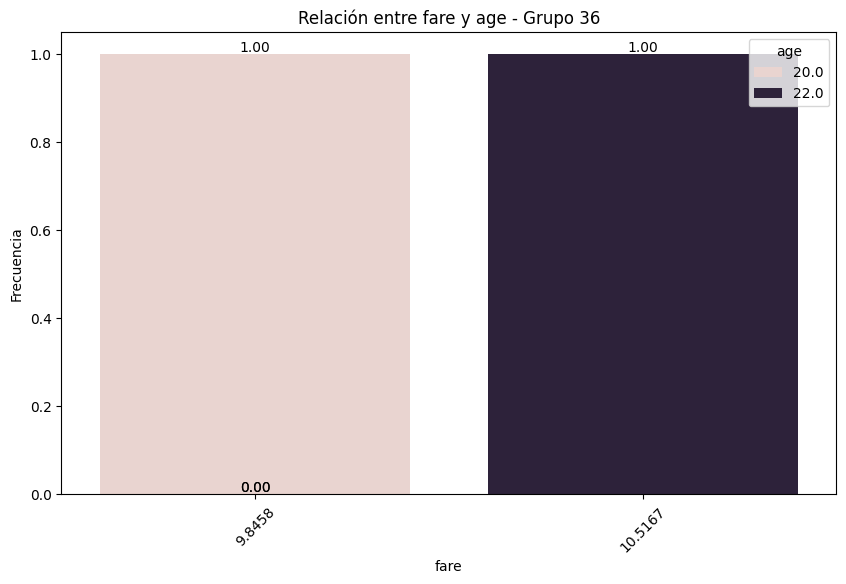

Supervivencia yes:


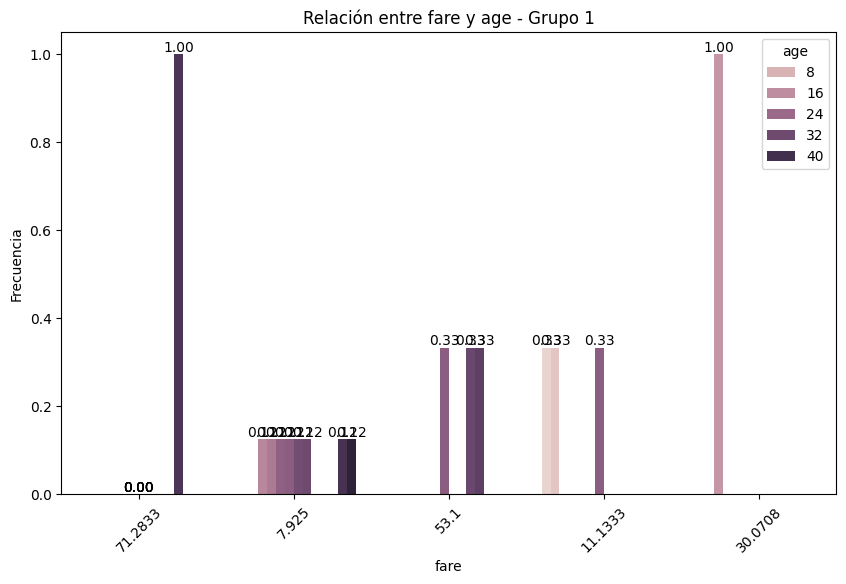

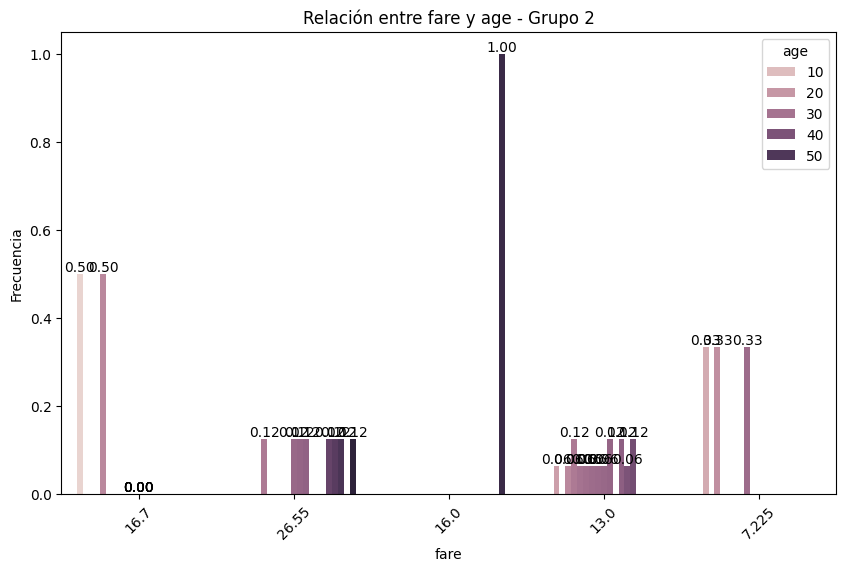

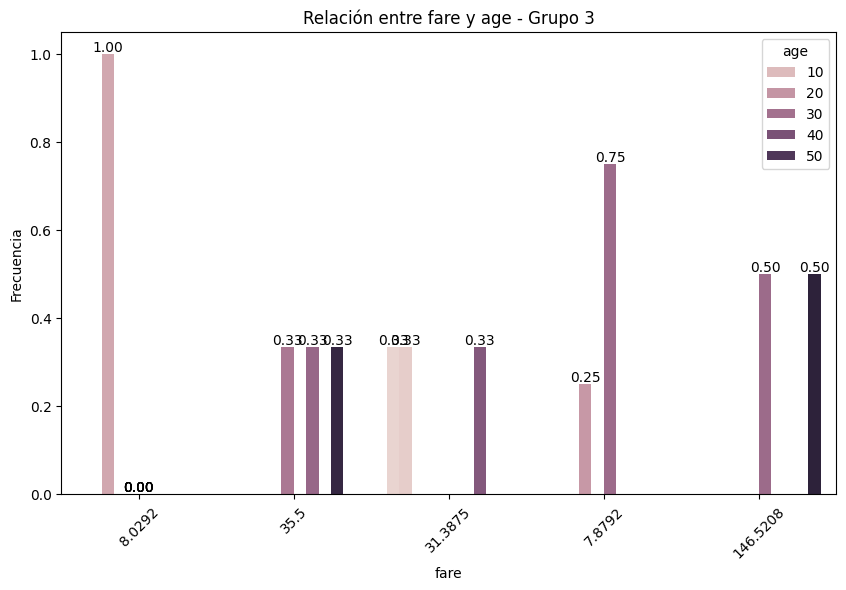

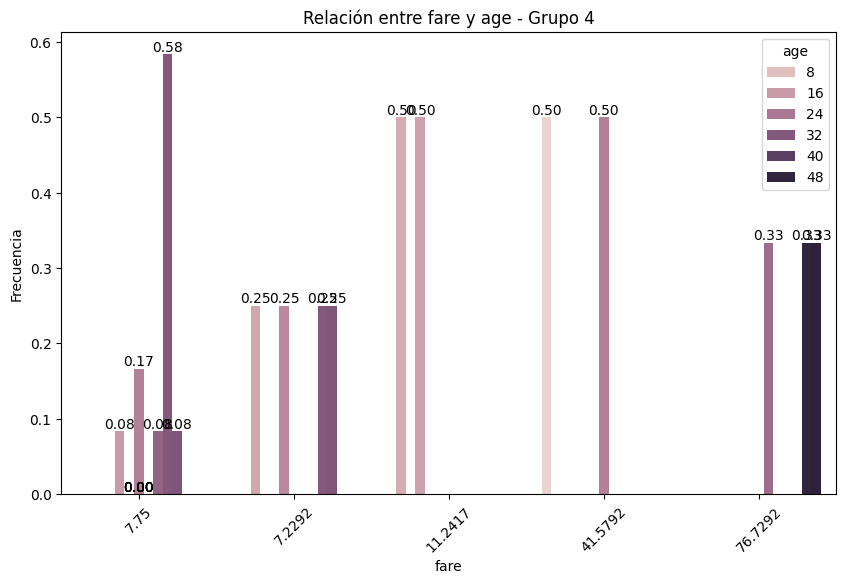

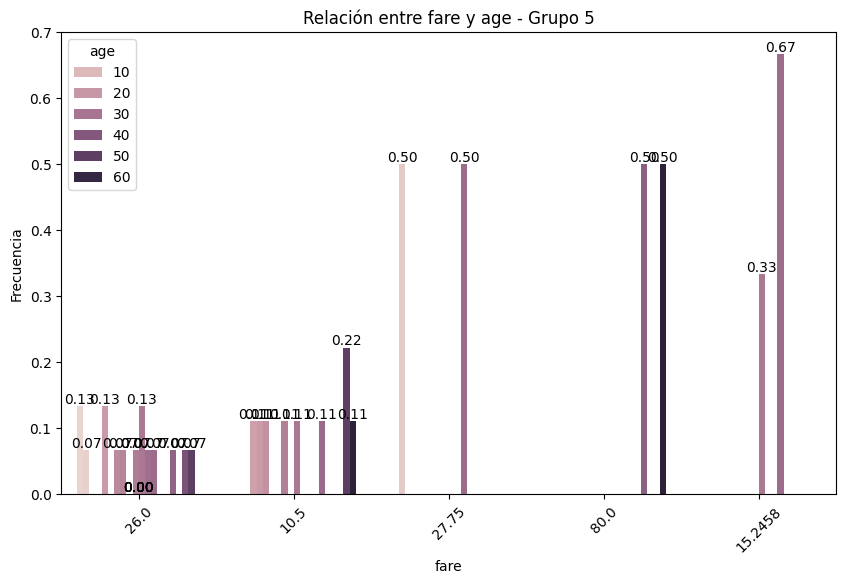

...

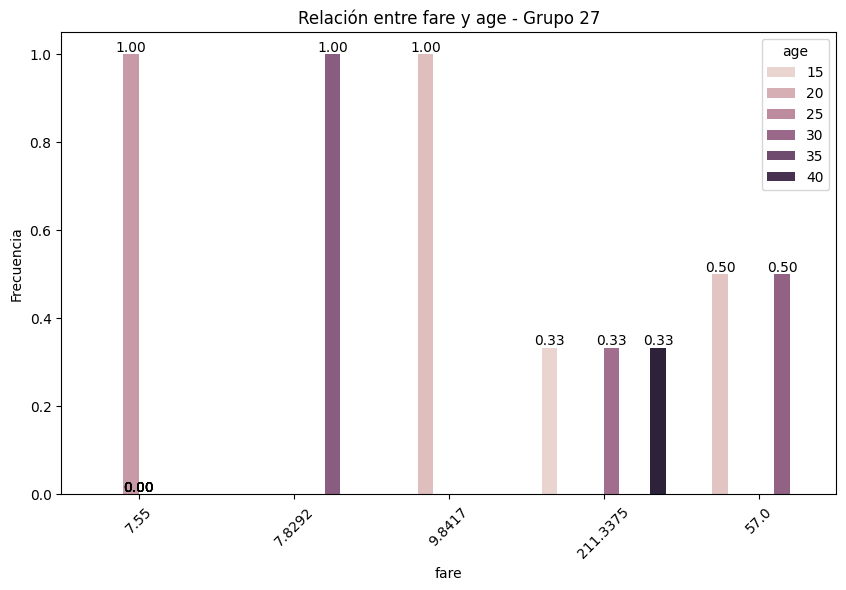

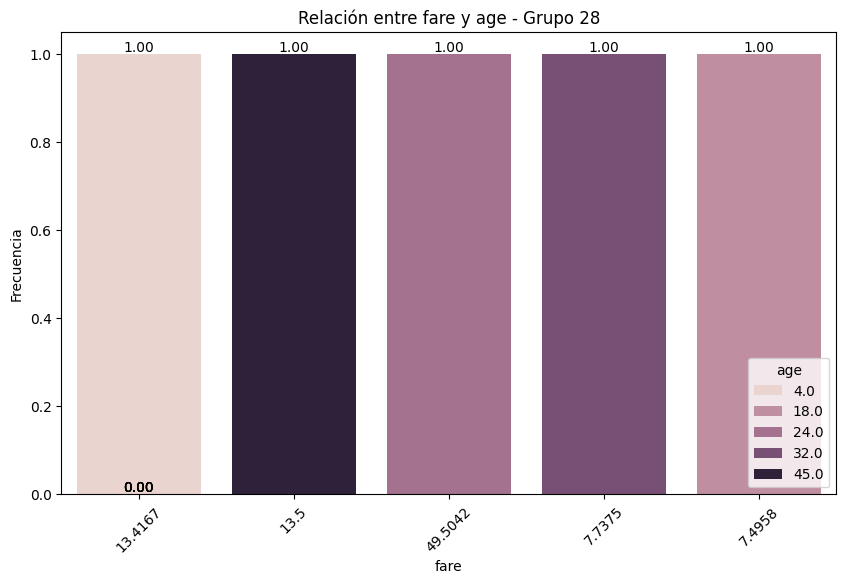

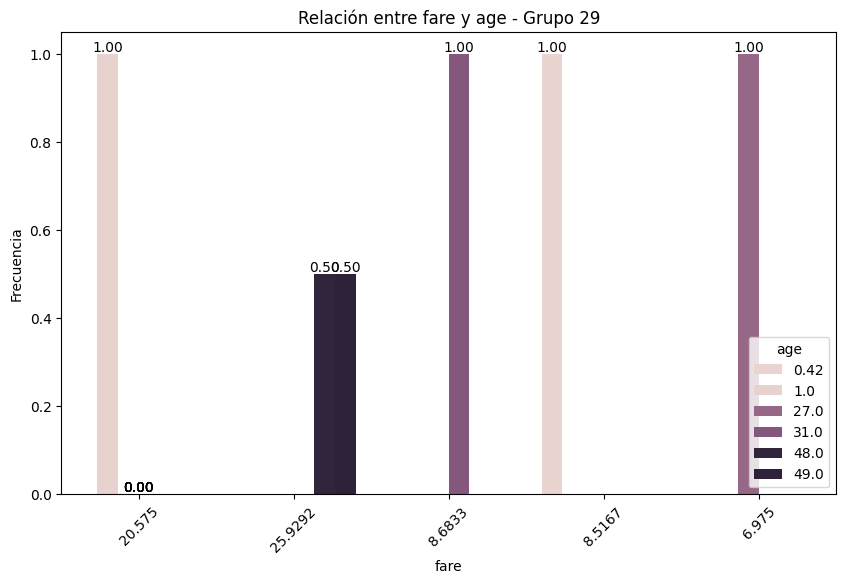

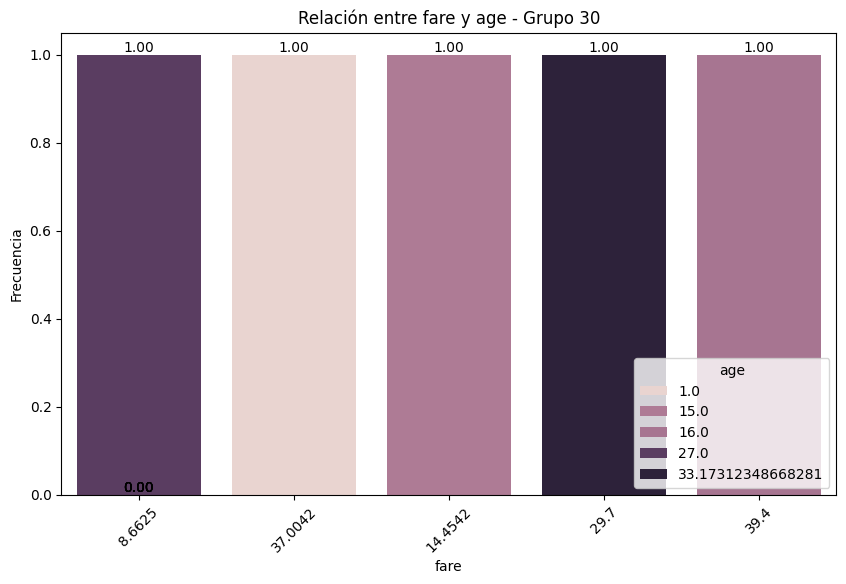

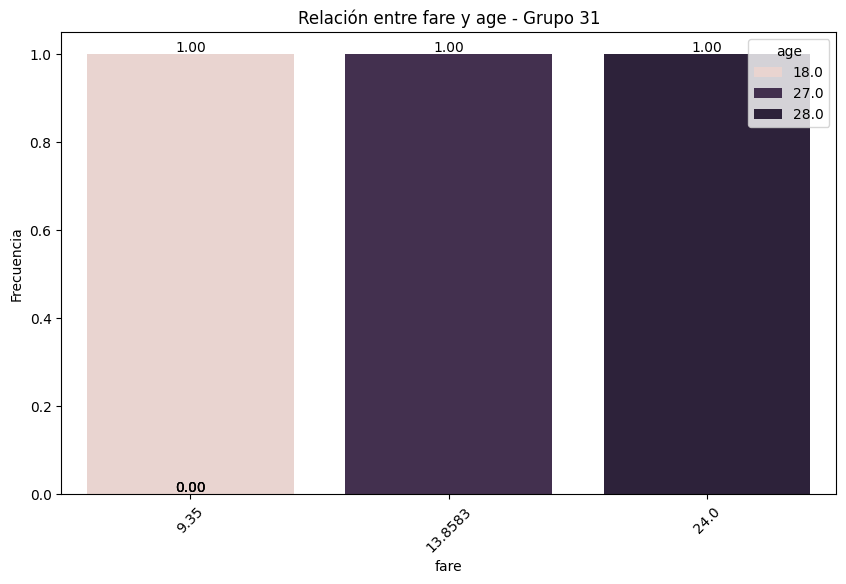

In [53]:
for valor,df_datos in diccionario_multivariante.items():
    print(f"Supervivencia {valor}:")
    plot_categorical_relationship_fin(df_datos,col_2,col_1, relative_freq= True, show_values= True)

## #2 Viajes

El objetivo en este caso no es tanto hacer un montón de análisis sino de completar lo que quedó pendiente en el workout y de entender cómo de un dataset podemos obtener preguntas o hipótesis interesantes (si las hay)

### #2.1 

Carga el dataset de viajes del mes de junio. Repite el análisis bivariante entre las variables "Aircompany" e "Ingresos", mostrando previamente los viajes por compañía aérea. ¿Qué situación llamativa nos surgió? (Ten en cuenta que somos el departamenteo de DataScience de TabarAir)

In [56]:
df_air_jun = pd.read_csv("/Users/lauragarcia/REPO_PRUEBA/ONLINE_DS_THEBRIDGE_Curso2025/03_Analisis_de_Datos/Sprint_07/Unidad_02/Practica_Obligatoria/data/dataset_viajes_jun.csv")

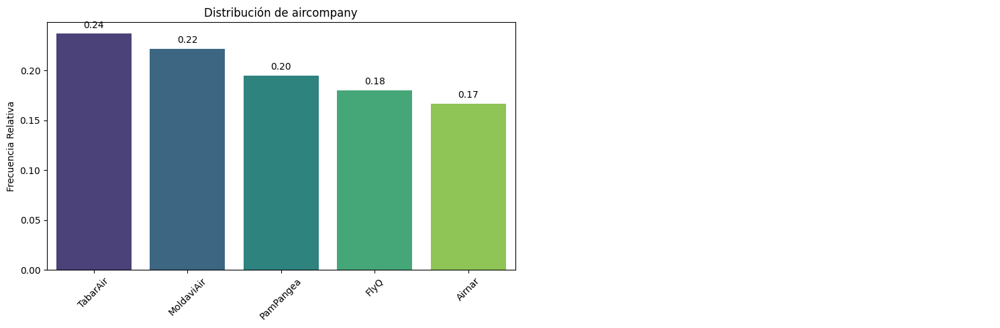

In [57]:
pinta_distribucion_categoricas(df_air_jun,["aircompany"], relativa= True, mostrar_valores= True)

(2,)


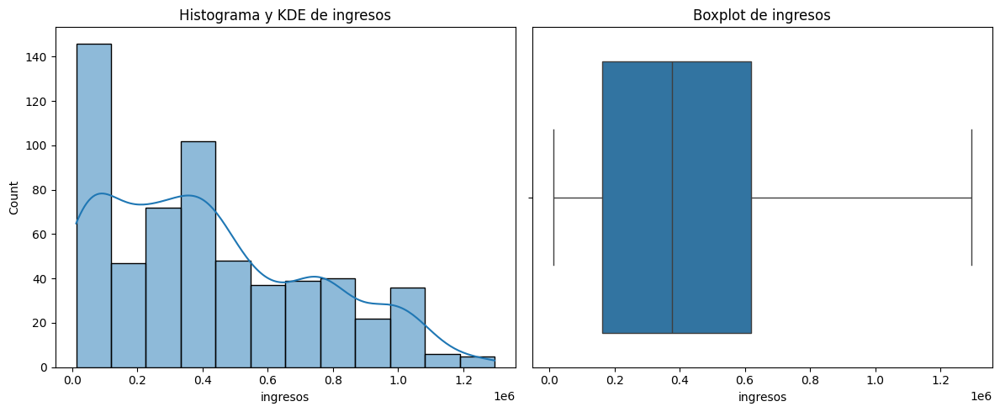

In [58]:
plot_combined_graphs(df_air_jun,["ingresos"])

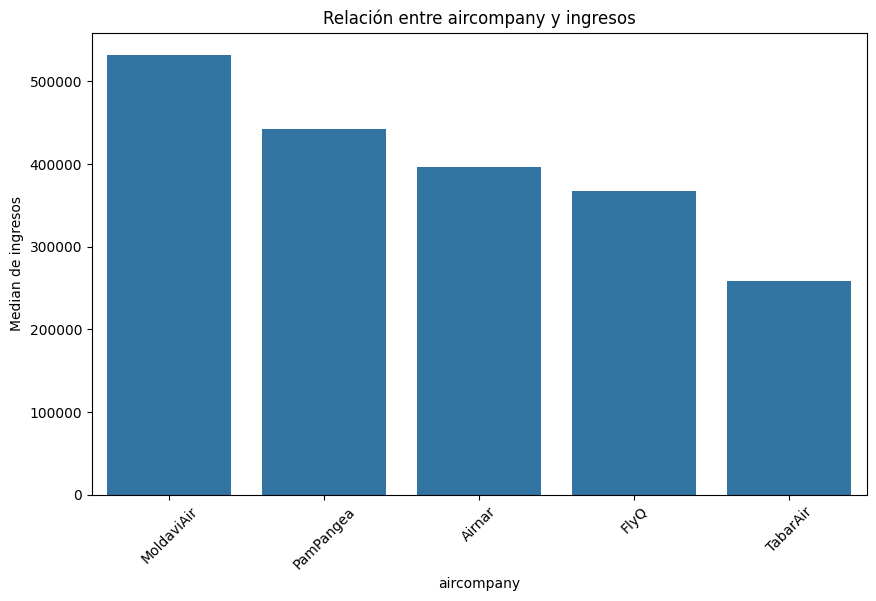

In [59]:
plot_categorical_numerical_relationship(df_air_jun, "aircompany","ingresos",measure="median") # Utilizando mediana

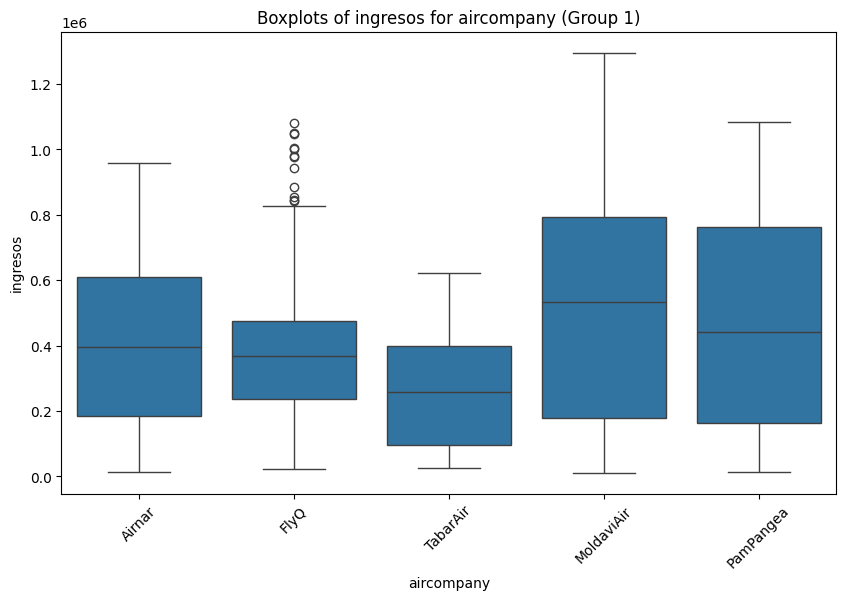

In [60]:
plot_grouped_boxplots(df_air_jun,"aircompany","ingresos")

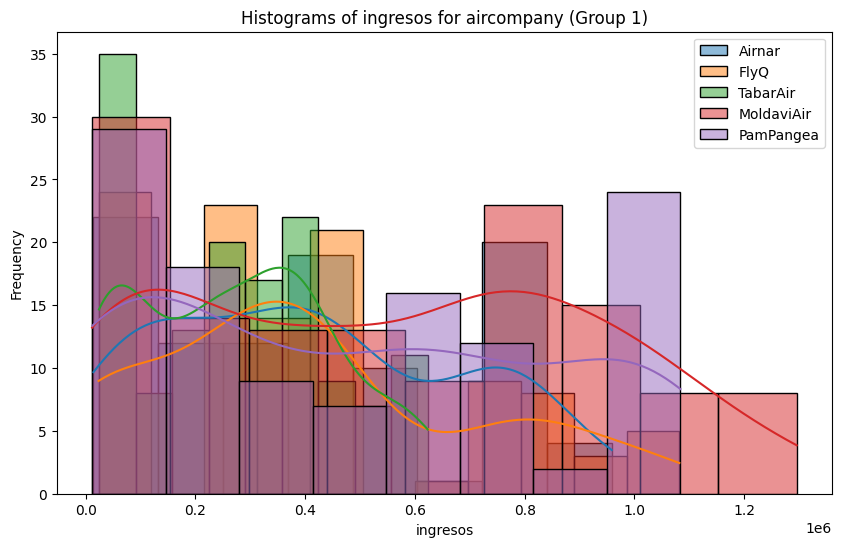

In [61]:
plot_grouped_histograms(df_air_jun,"aircompany", "ingresos", 5)

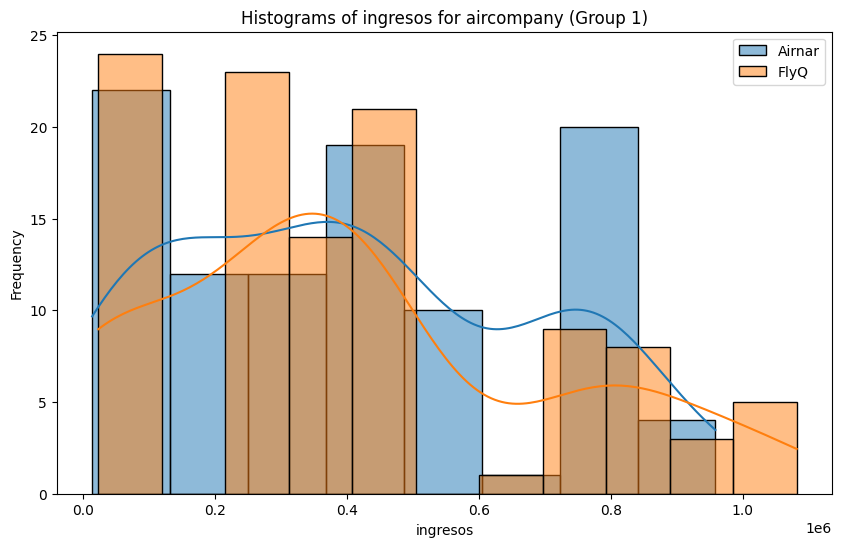

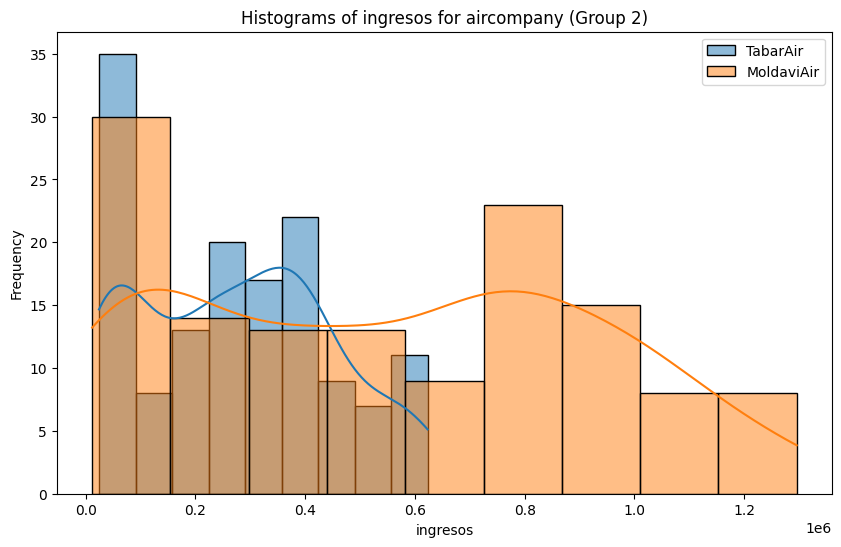

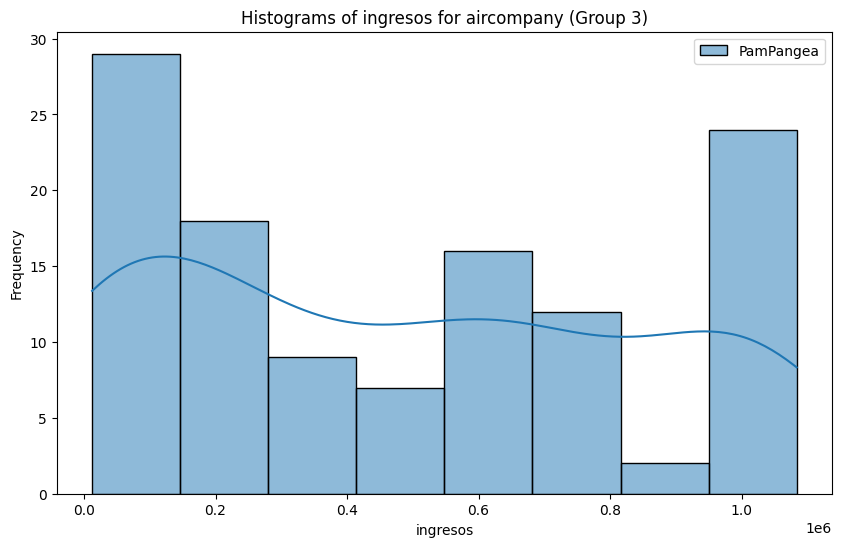

In [62]:
plot_grouped_histograms(df_air_jun,"aircompany", "ingresos", 2)

Se ve claramente que TabarAir tiene el menor rango de ingresos, que ya lo sabíamos de ver los boxplots, y que casi los concentramos, habrá que compararlo con distancias y consumos para chequear la eficiencia. Y sin ser un experto parece que Pampangea y Moldaviair tienen una dispersión de ingresos que invita a pensar que están mejor diversificados (tienen vuelos de todos los gustos, aunque esto es otra hipótesis a confirmar). Lo importante: Tabarair es la empresa con más vuelos, menos ingresos en mediana, menor rango de ingresos con un pico en vuelos de pocos ingresos y una distribución casi gaussiana. Mientras Airnar con menos vuelos es la tercera en ingresos. Hmm, se pone interesante este dataset.




### #2.2

Repite el análisis multivariante entre "ingresos","distancias" y "consumo_kg". ¿Qué veíamos que parecía también muy prometedor?

(3, 2)


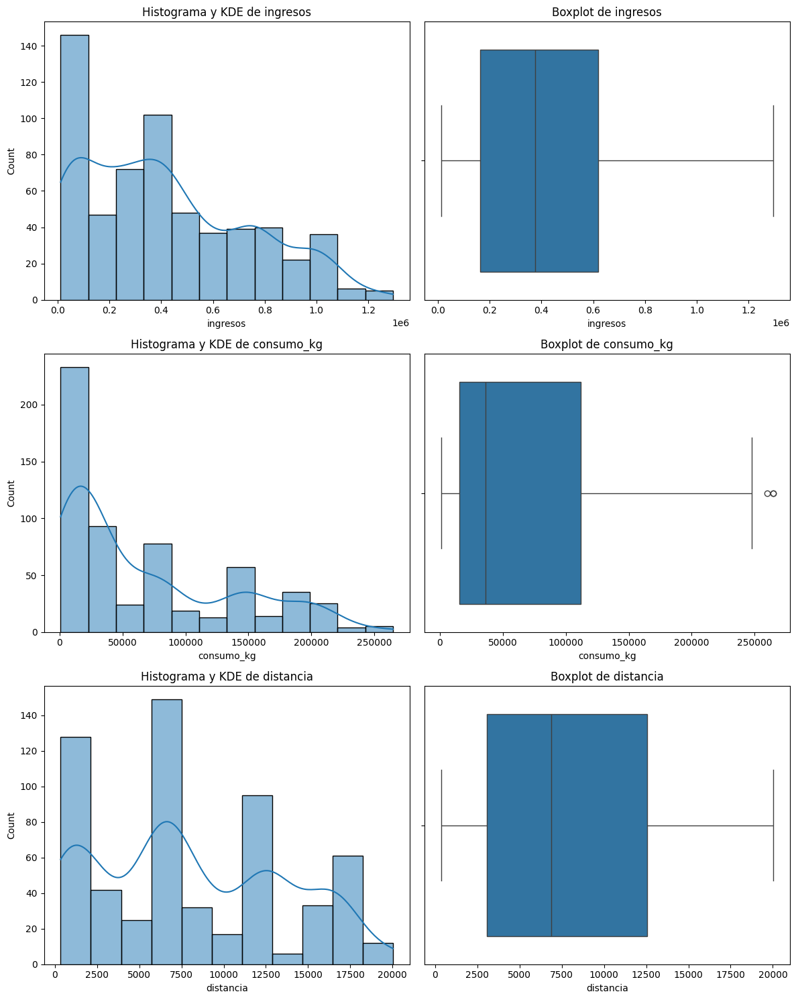

In [68]:
plot_combined_graphs(df_air_jun,["ingresos","consumo_kg","distancia"])

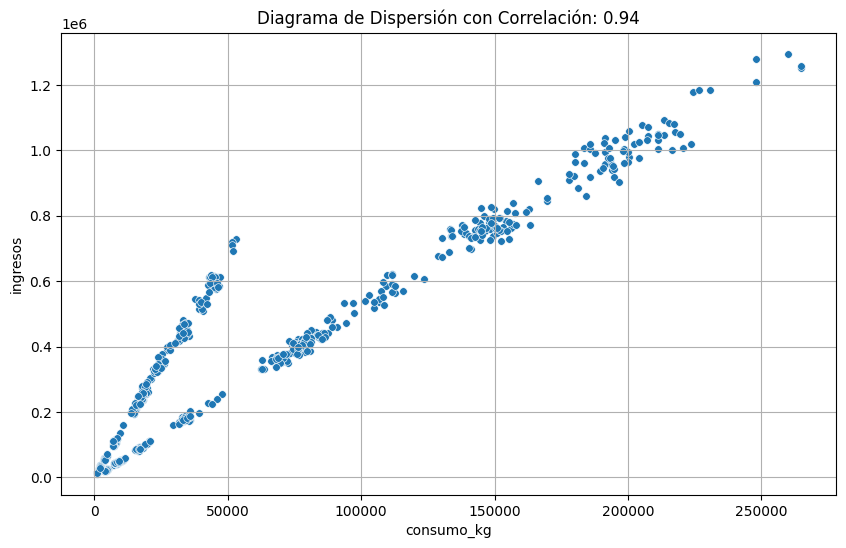

In [69]:
grafico_dispersion_con_correlacion(df_air_jun,"consumo_kg", "ingresos", mostrar_correlacion= True, tamano_puntos= 30)

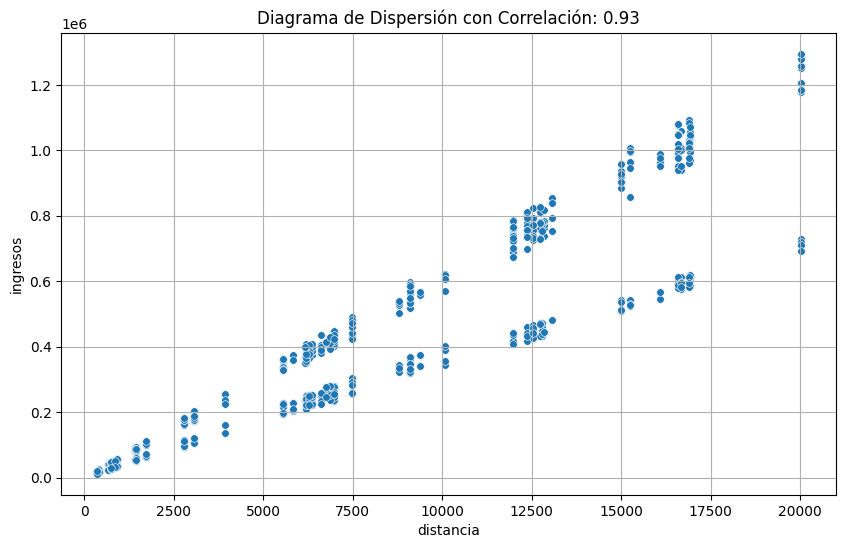

In [70]:
grafico_dispersion_con_correlacion(df_air_jun,"distancia","ingresos", mostrar_correlacion= True, tamano_puntos= 30)

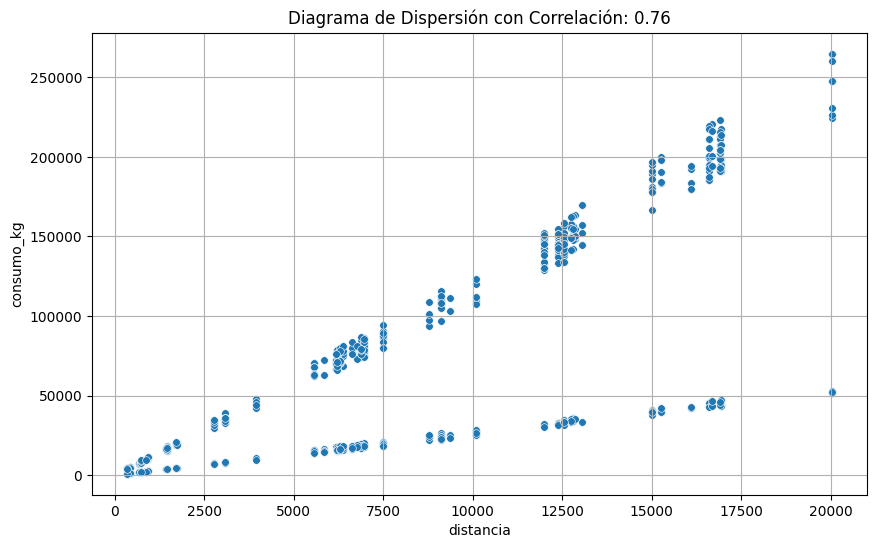

In [71]:
grafico_dispersion_con_correlacion(df_air_jun,"distancia","consumo_kg", mostrar_correlacion= True, tamano_puntos= 30)

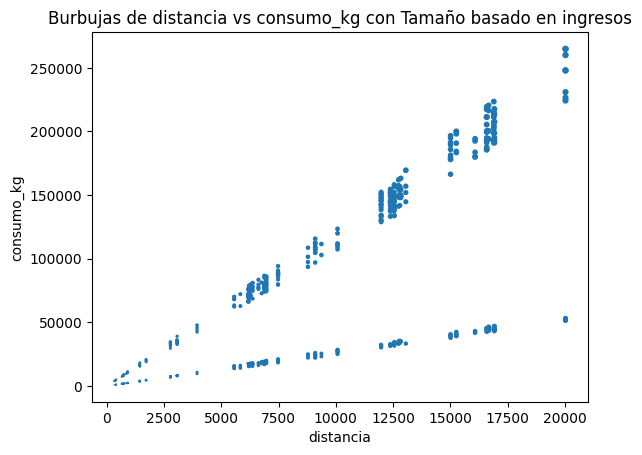

In [72]:
bubble_plot(df_air_jun,"distancia","consumo_kg","ingresos", scale = 100000)

El tamaño de las burbujas depende de los ingresos, se ve la correlación entre distancia y consumo, auque claramene hay una línea de vuelos mucho más eficientes y si nos fijamos en los tamaños de las burbujas de una línea y otra son aparentemente similares. Es decir parece y esta sería una gran línea de trabajo, un conjunto de viajes que son más eficientes en todos los términos que otros.

### #2.3

Crea una variable categorica "cat_vuelo" a partir de distancias, escoge los rangos de las categorías basándote en la distribución de valores de "distancia" (sugerencia entre 3 y 4 categorías). Extra: Reaiza ahora otra vez el análisis multivariante "cat_vuelo", "ingresos", "consumo_kg". ¿Ves algo diferente?

In [66]:
df_air_jun

def clasificador_apply(distancia):
    if distancia > 9000:
            clasificacion = "LD"
    elif distancia >= 1500:
        clasificacion = "MD"
    else:
        clasificacion = "R"
    return clasificacion

In [67]:
df_air_jun["cat_vuelo"] = df_air_jun["distancia"].apply(clasificador_apply)
df_air_jun

,aircompany,origen,destino,distancia,avion,con_escala,consumo_kg,duracion,ingresos,id_vuelo,mes,cat_vuelo
0,Airnar,París,Ginebra,411,Boeing 737,False,1028.691900,51,14232.65,Air_PaGi_10737,Jun23,R
1,FlyQ,Bali,Roma,12738,Boeing 737,True,33479.132544,1167,468527.19,Fly_BaRo_10737,Jun23,LD
2,TabarAir,Ginebra,Los Angeles,9103,Airbus A380,False,109439.907200,626,584789.19,Tab_GiLo_11380,Jun23,LD
3,MoldaviAir,París,Cincinnati,6370,Boeing 737,False,17027.010000,503,233342.51,Mol_PaCi_10737,Jun23,MD
4,TabarAir,Cincinnati,Roma,7480,Boeing 747,False,86115.744000,518,438535.07,Tab_CiRo_10747,Jun23,MD
...,...,...,...,...,...,...,...,...,...,...,...,...
595,PamPangea,Bali,Londres,12553,Boeing 737,True,33310.138680,1153,442668.52,Pam_BaLo_10737,Jun23,LD
596,Airnar,Cádiz,París,1447,Airbus A380,False,17229.139600,116,87307.63,Air_CaPa_11380,Jun23,R
597,Airnar,Los Angeles,Cádiz,9373,Boeing 737,False,23231.917800,731,339943.47,Air_LoCa_10737,Jun23,LD
598,FlyQ,Barcelona,Bali,13058,Boeing 747,True,144766.211200,1070,752212.98,Fly_BaBa_10747,Jun23,LD


(3, 2)


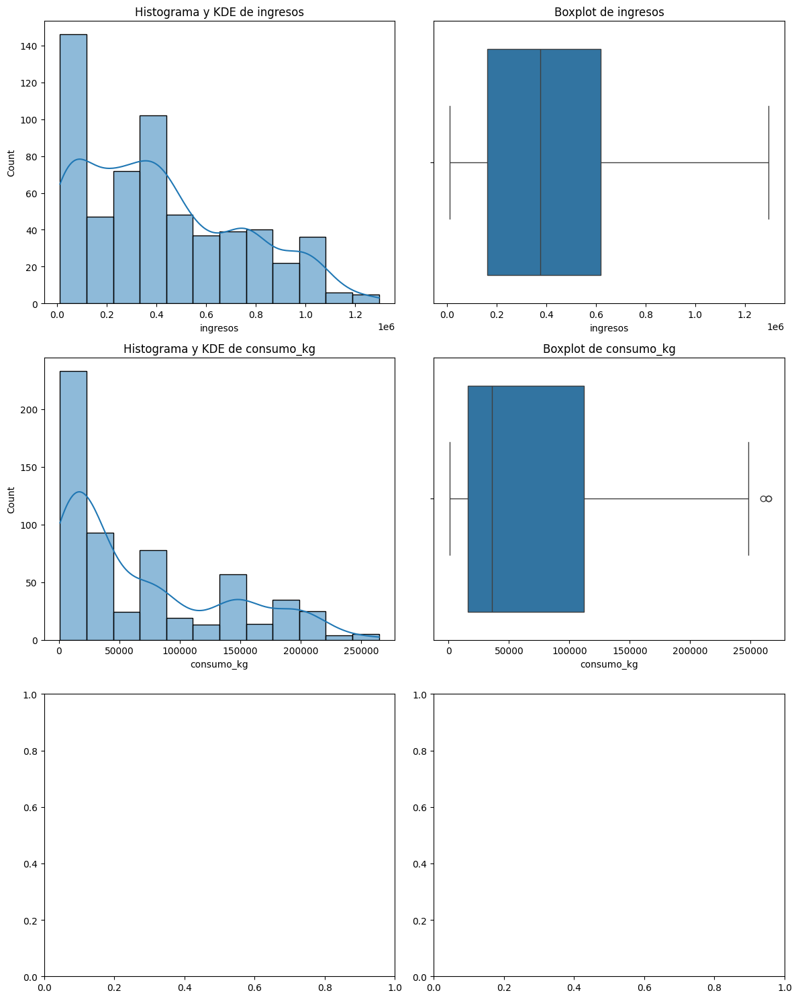

In [73]:
plot_combined_graphs(df_air_jun,["ingresos","consumo_kg","cat_vuelo"])

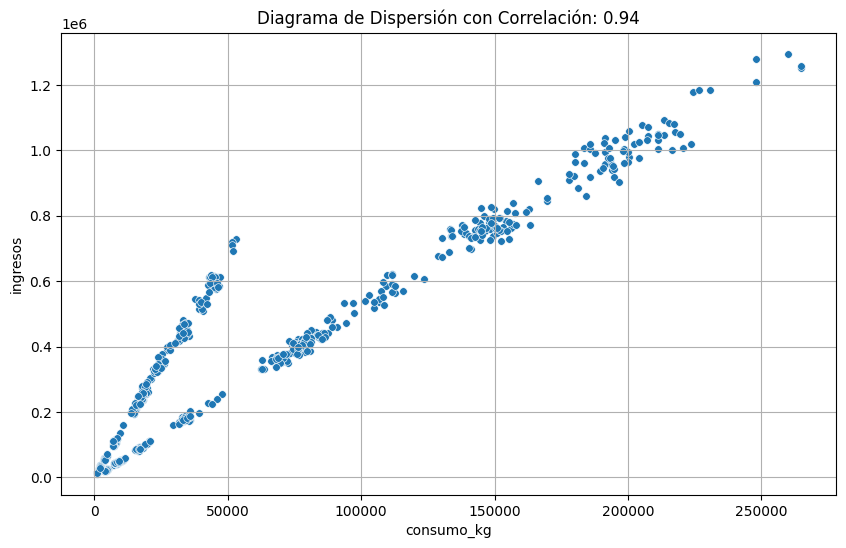

In [74]:
grafico_dispersion_con_correlacion(df_air_jun,"consumo_kg", "ingresos", mostrar_correlacion= True, tamano_puntos= 30)

ValueError: could not convert string to float: 'R'

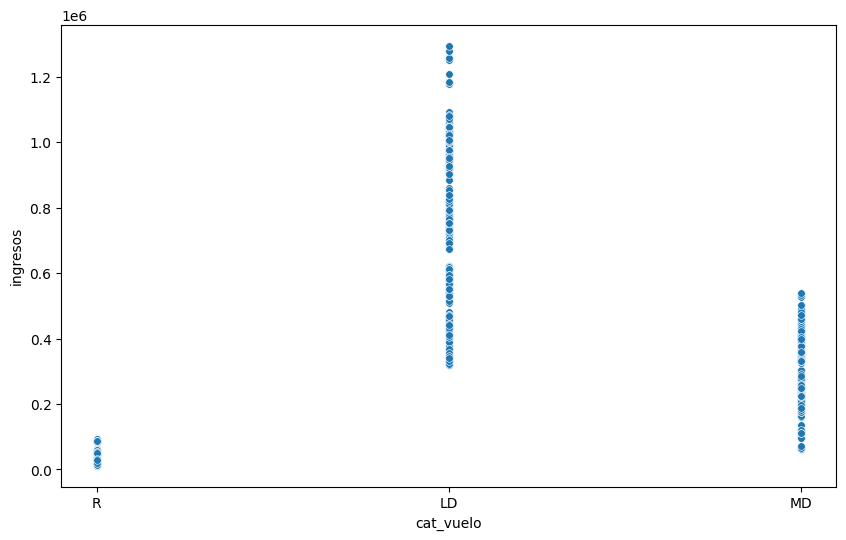

In [75]:
grafico_dispersion_con_correlacion(df_air_jun,"cat_vuelo","ingresos", mostrar_correlacion= True, tamano_puntos= 30)

In [76]:
columnas = ["cat_vuelo","ingresos","consumo_kg"] 
col_directora = "cat_vuelo"
col_1 = [col for col in columnas if col != col_directora][0]
col_2 = [col for col in columnas if col != col_directora][1]
diccionario_multivariante = {}
for valor in df_air_jun[col_directora].unique():
    diccionario_multivariante[valor] = df_air_jun.loc[df_air_jun[col_directora] == valor,[col_2,col_1]] 

Respuesta R:


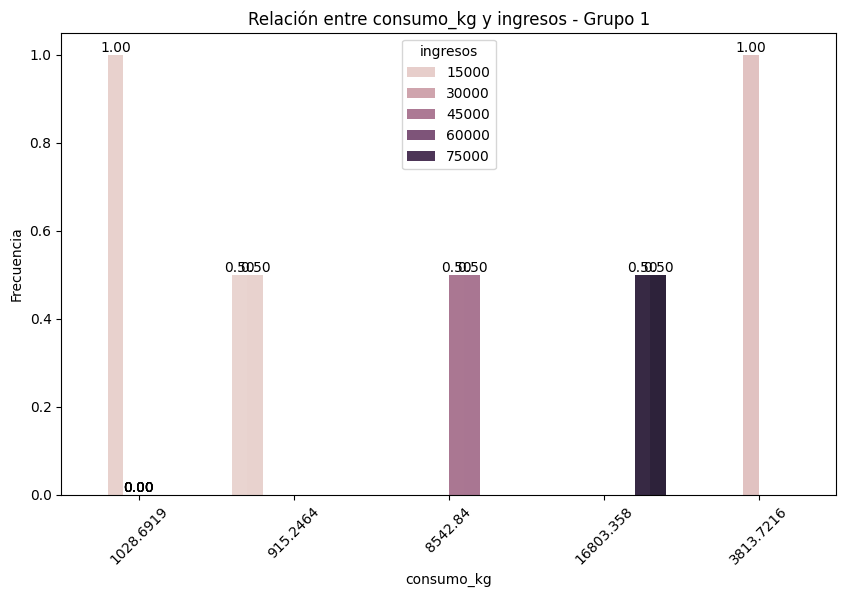

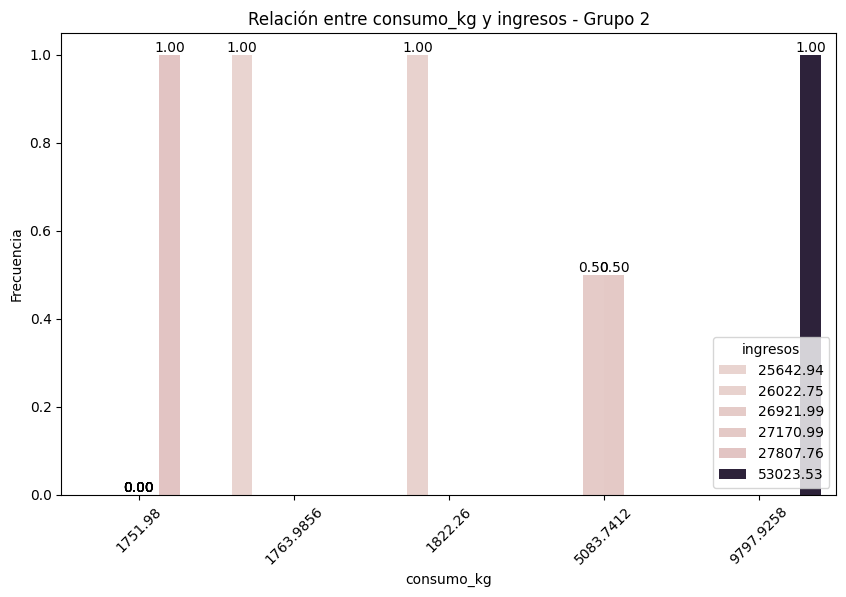

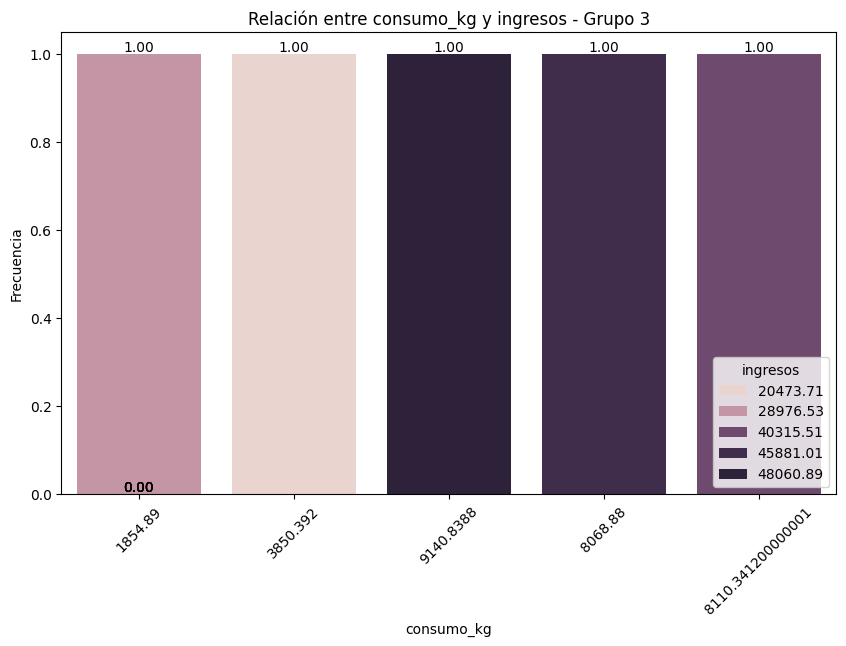

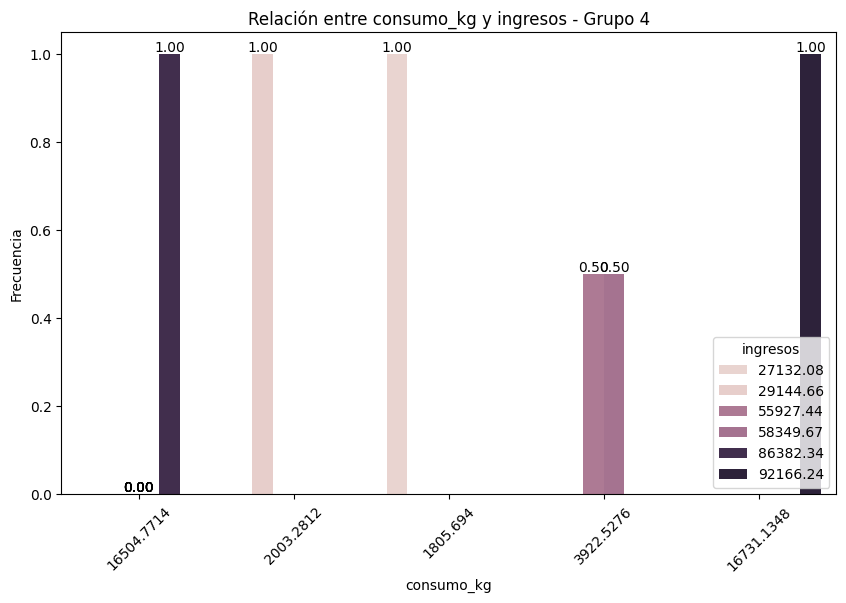

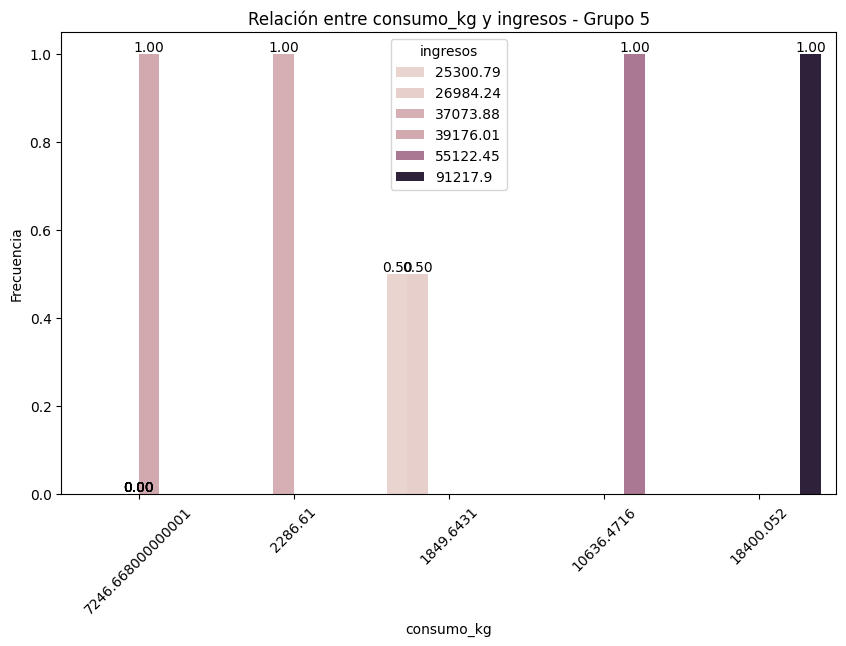

...

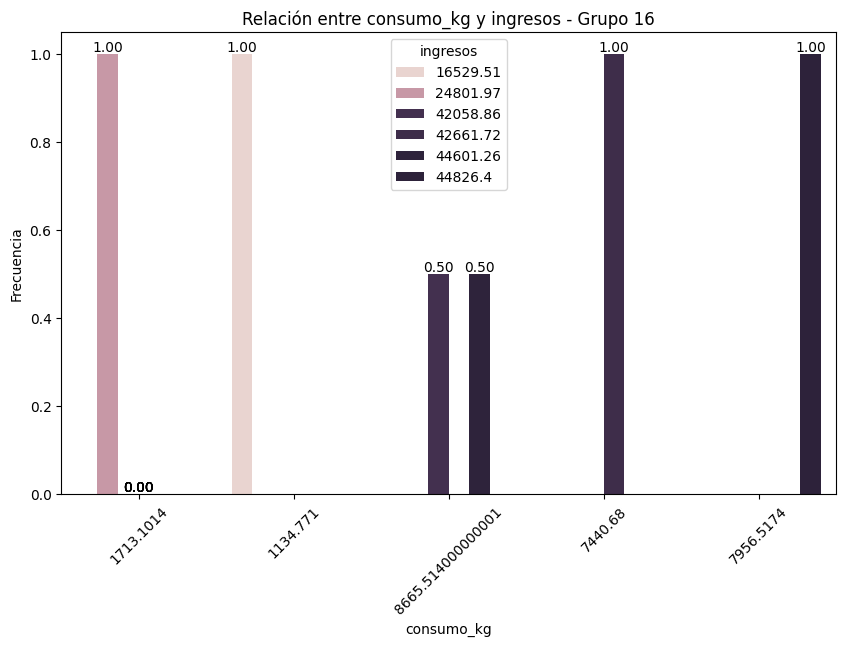

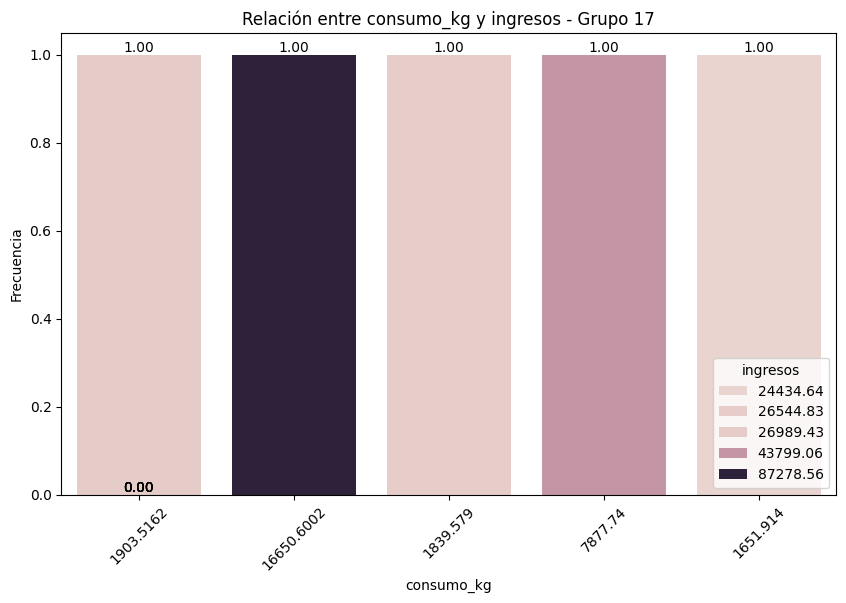

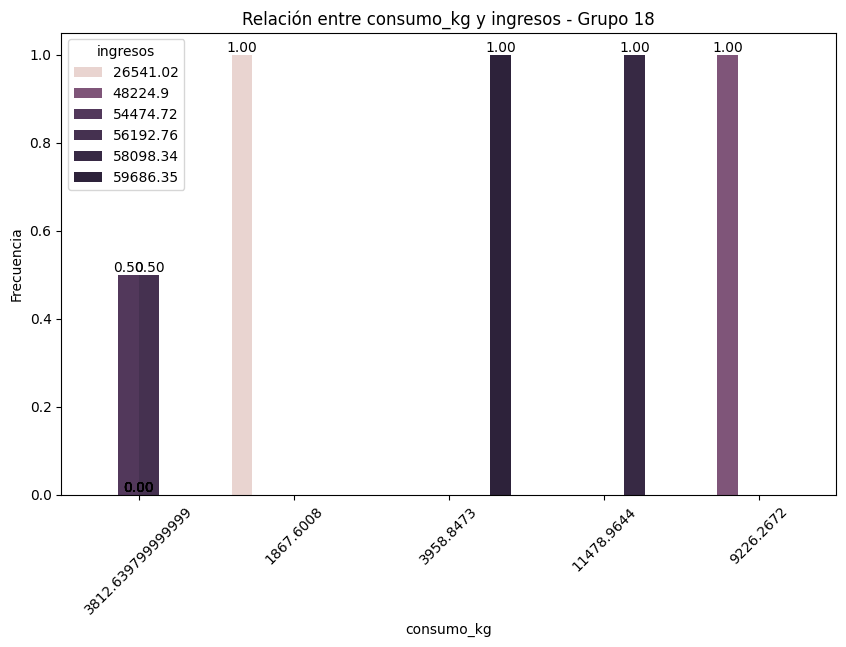

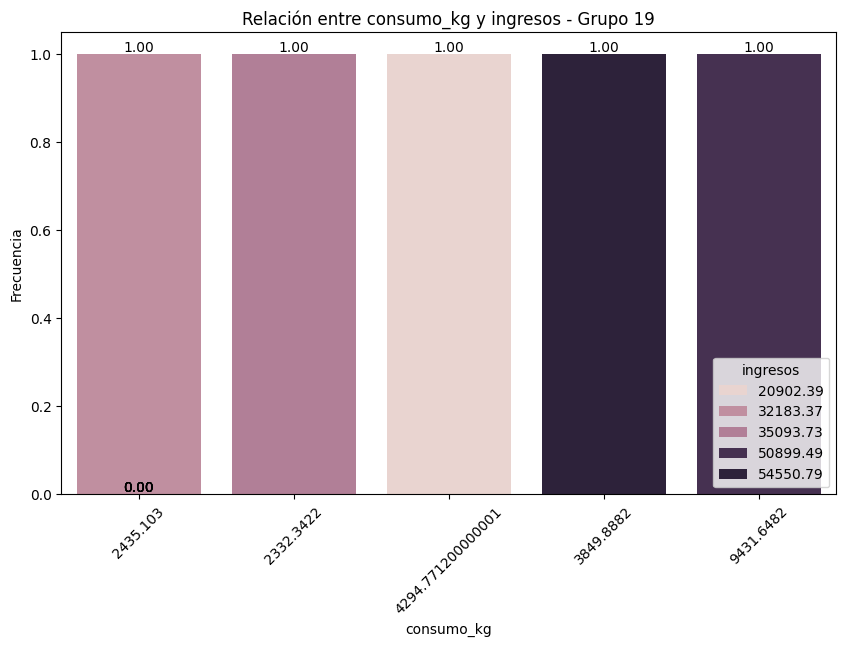

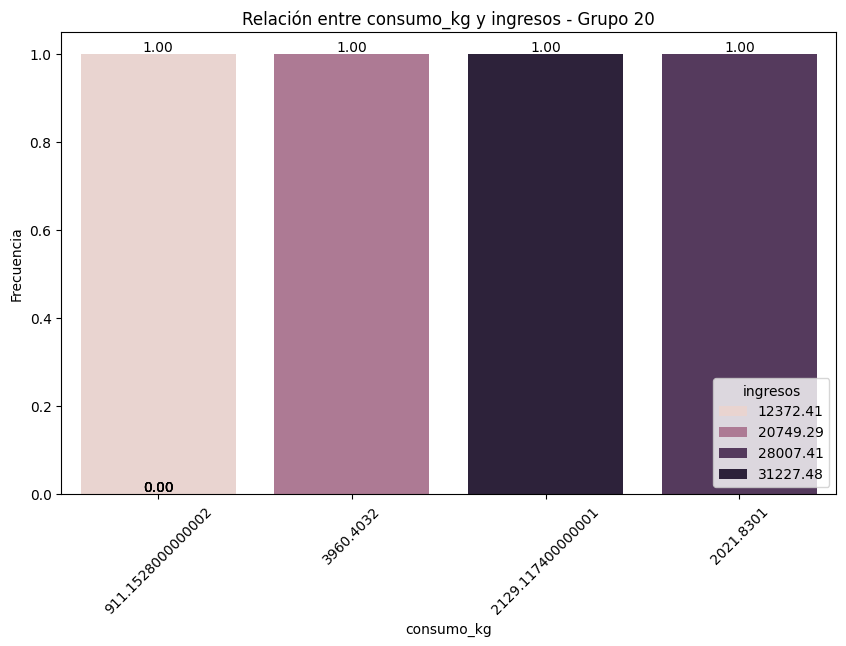

Respuesta LD:


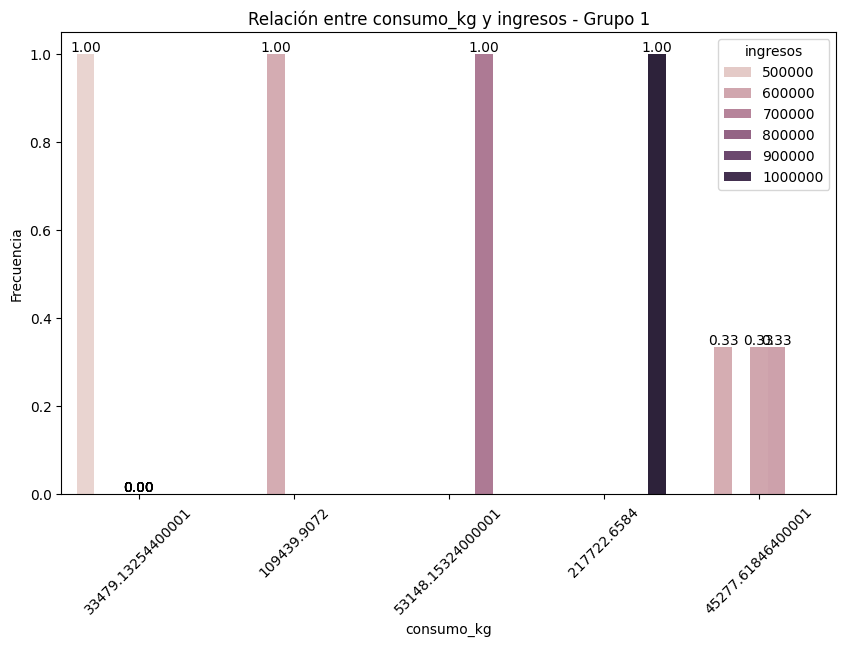

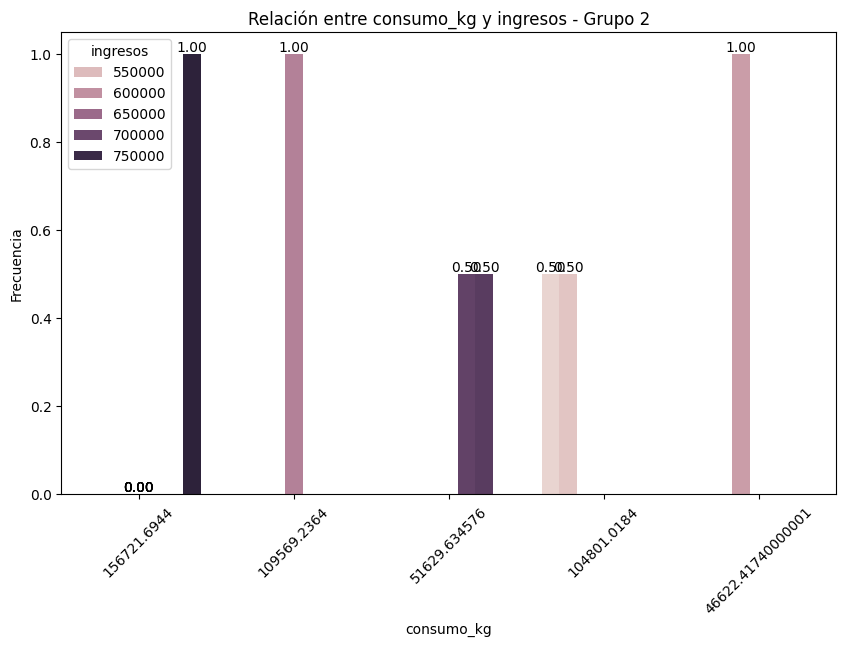

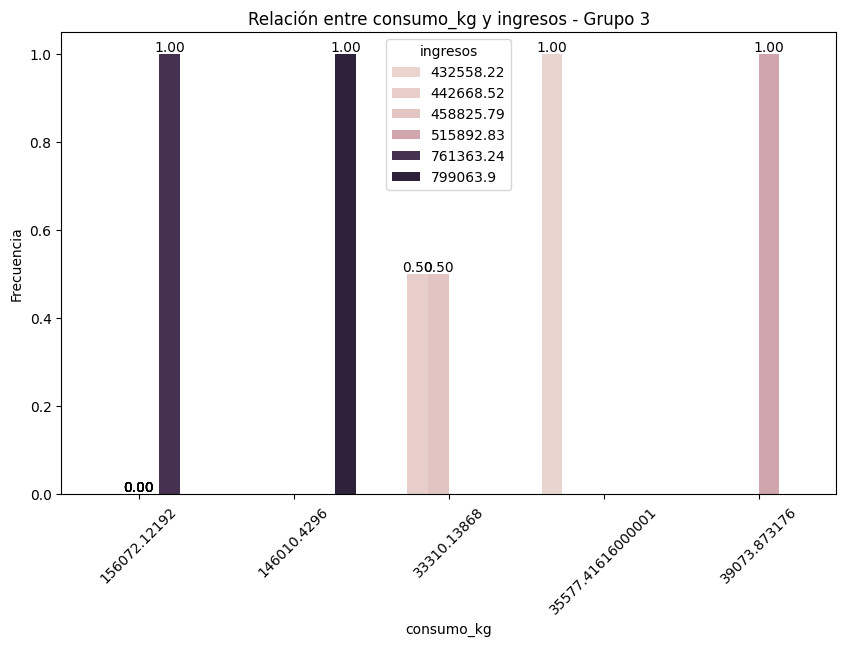

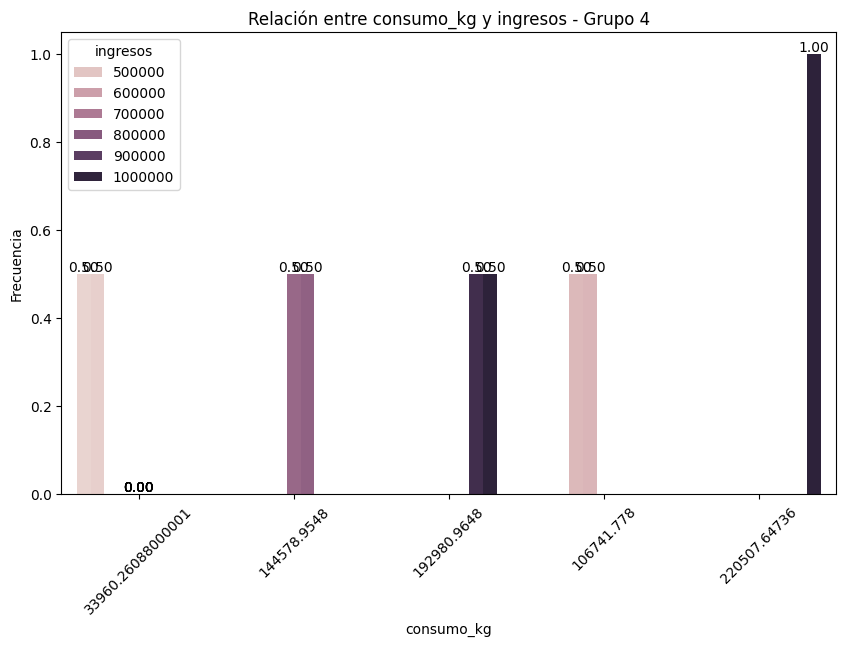

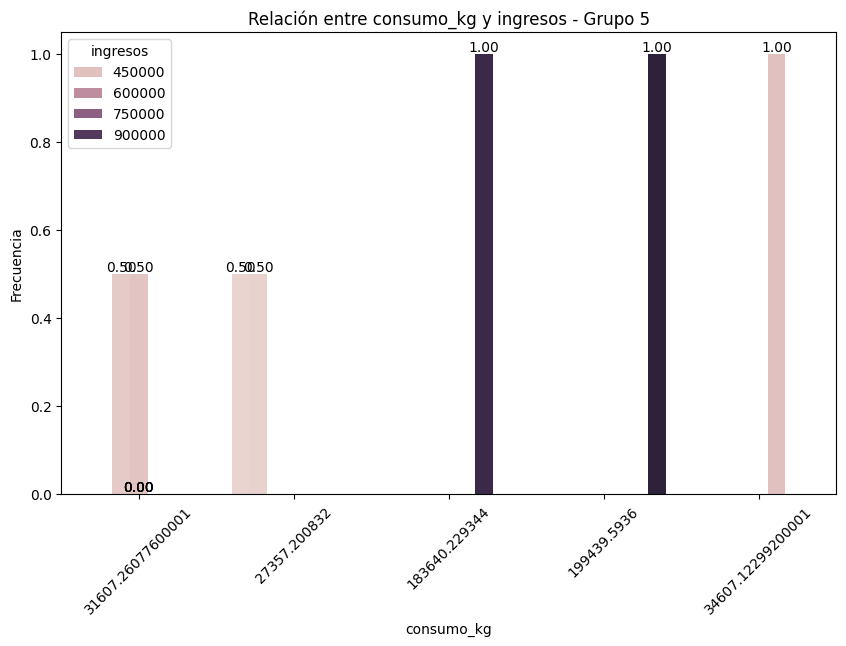

...

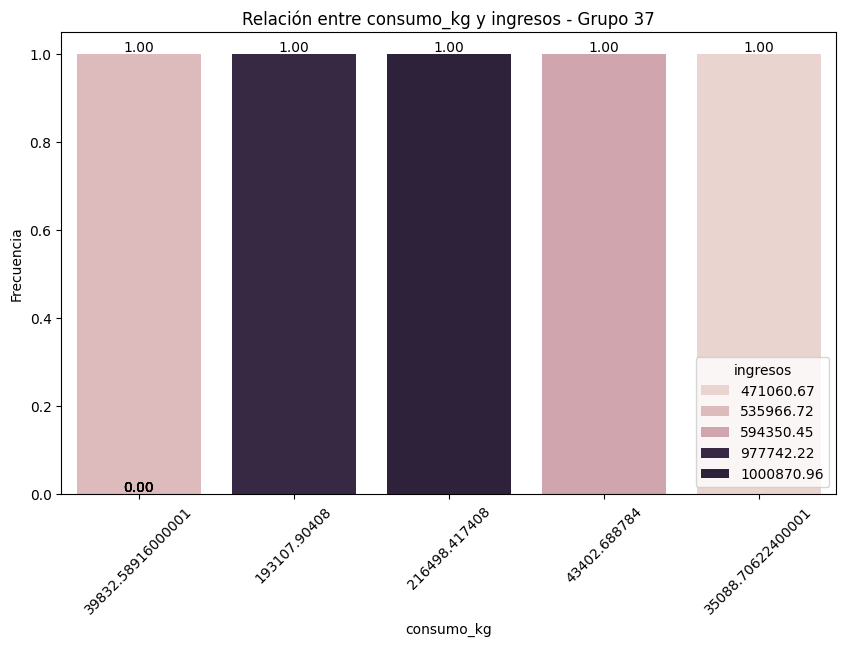

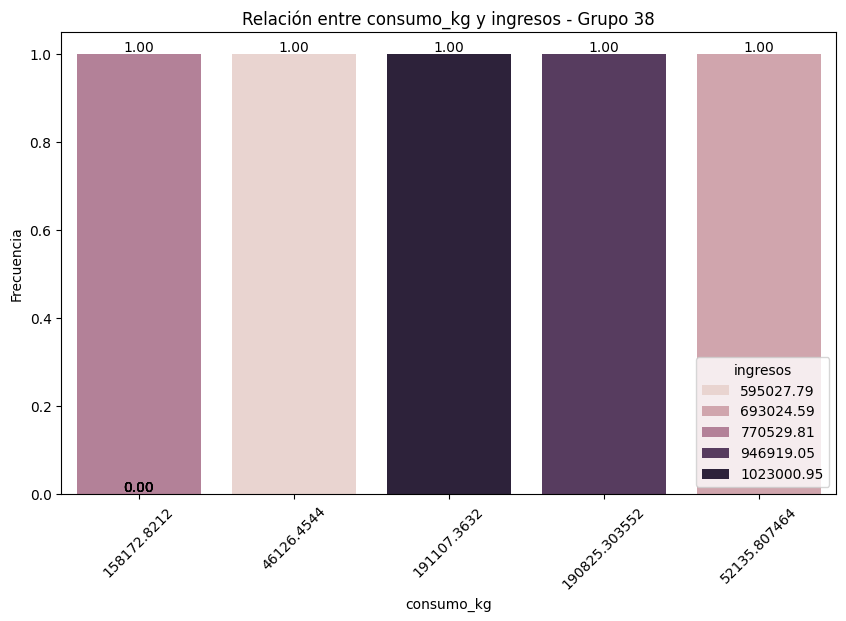

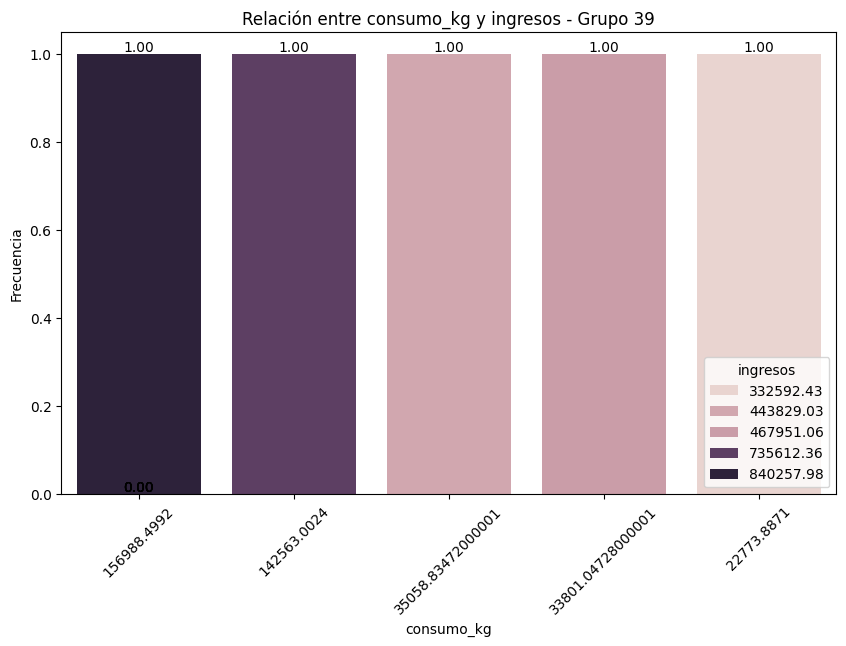

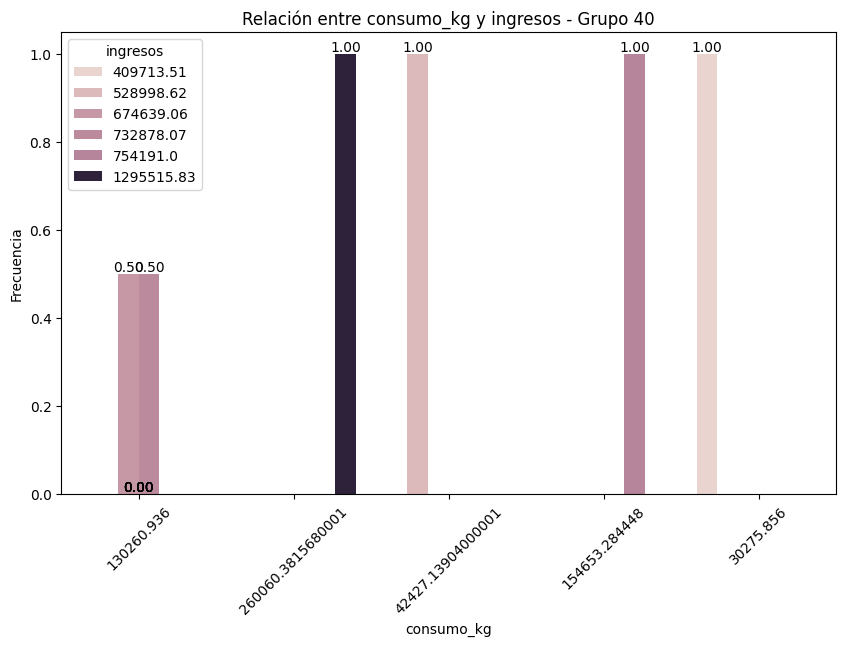

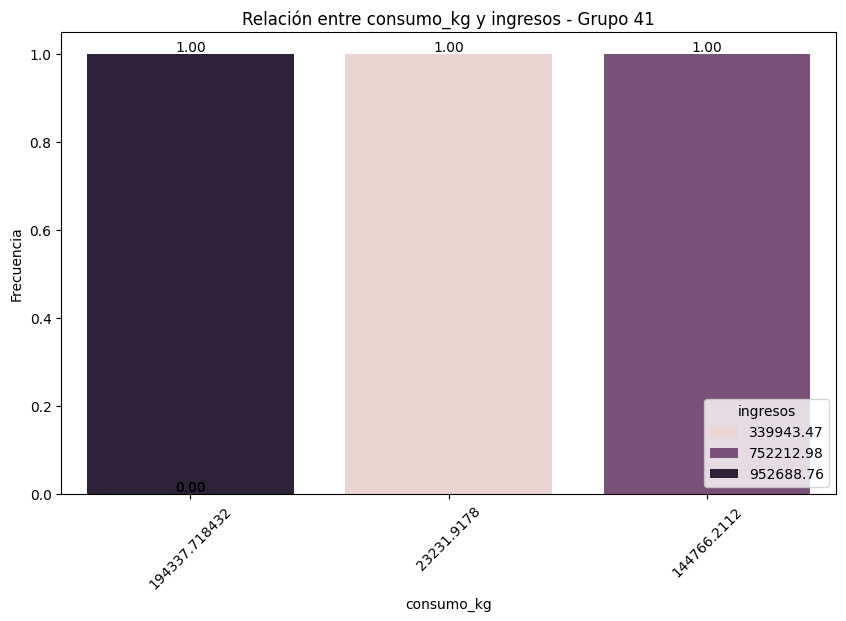

Respuesta MD:


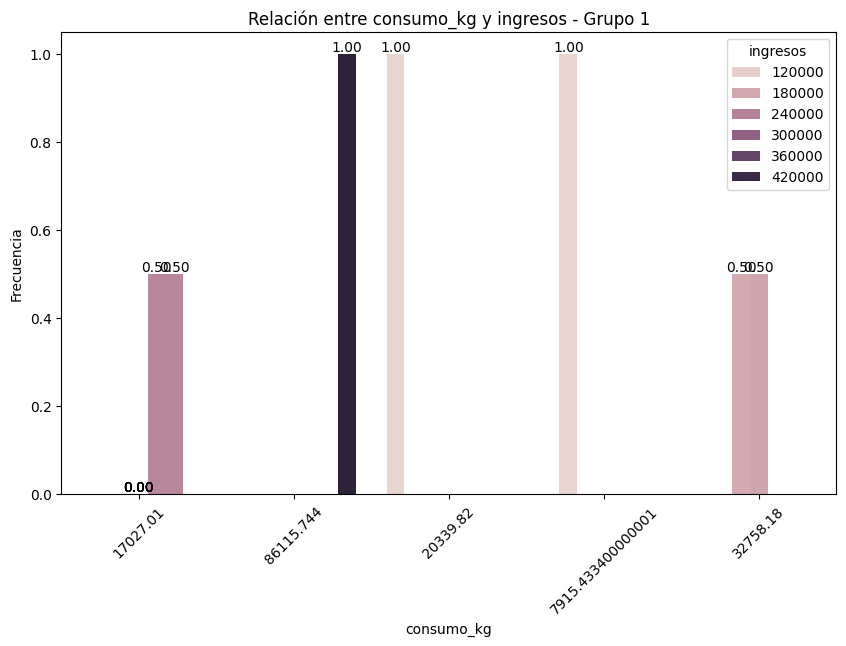

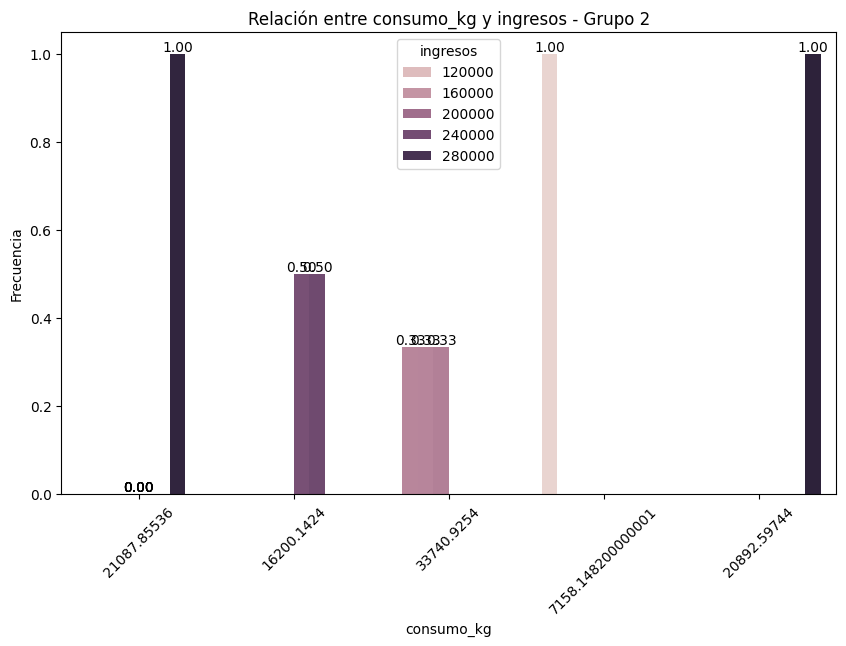

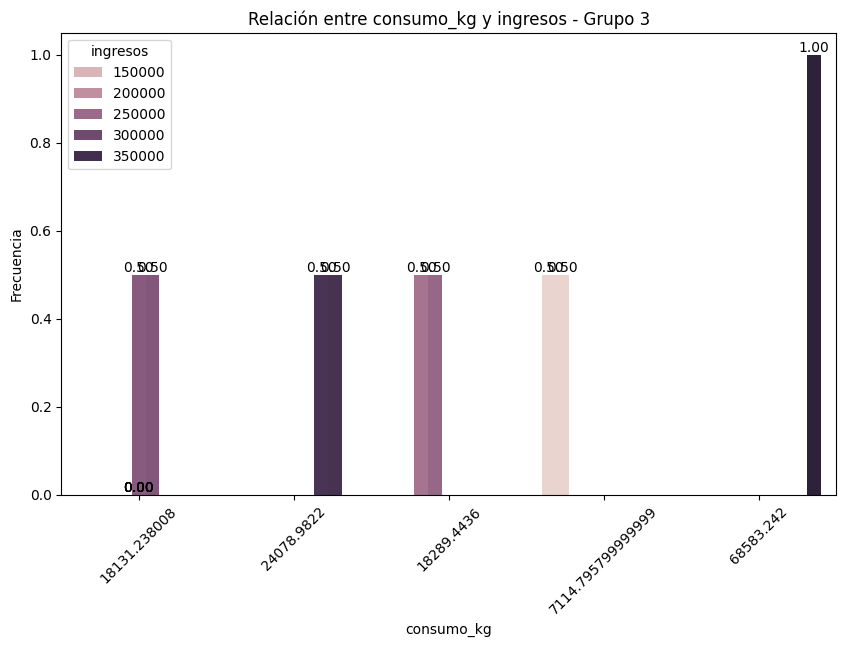

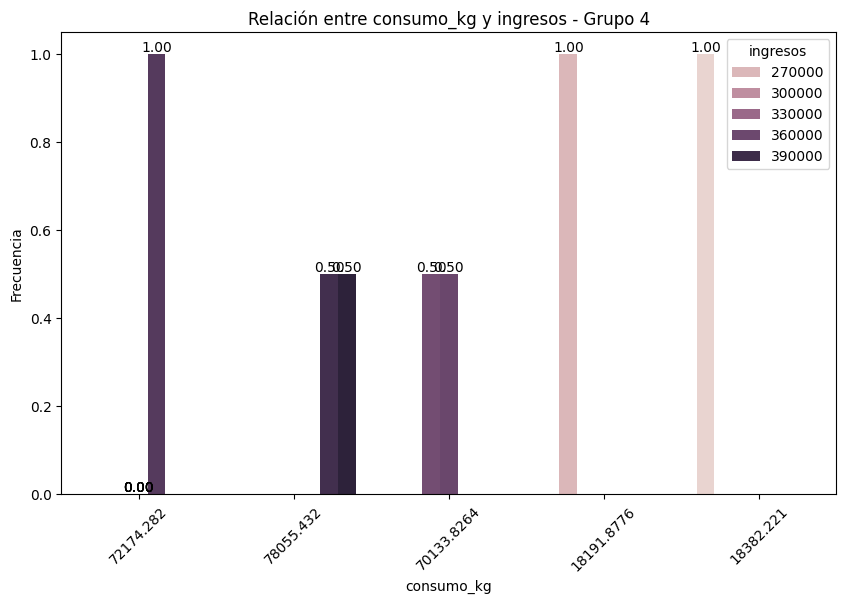

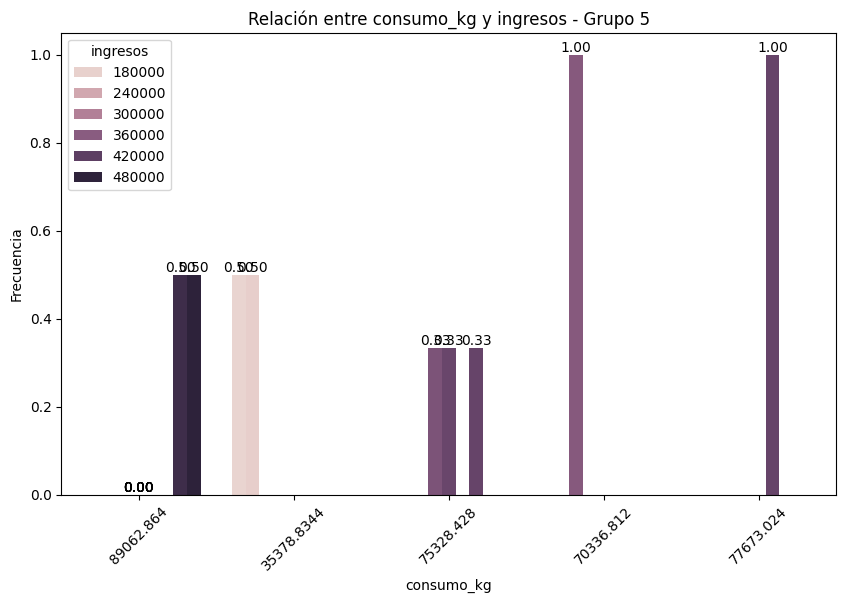

...

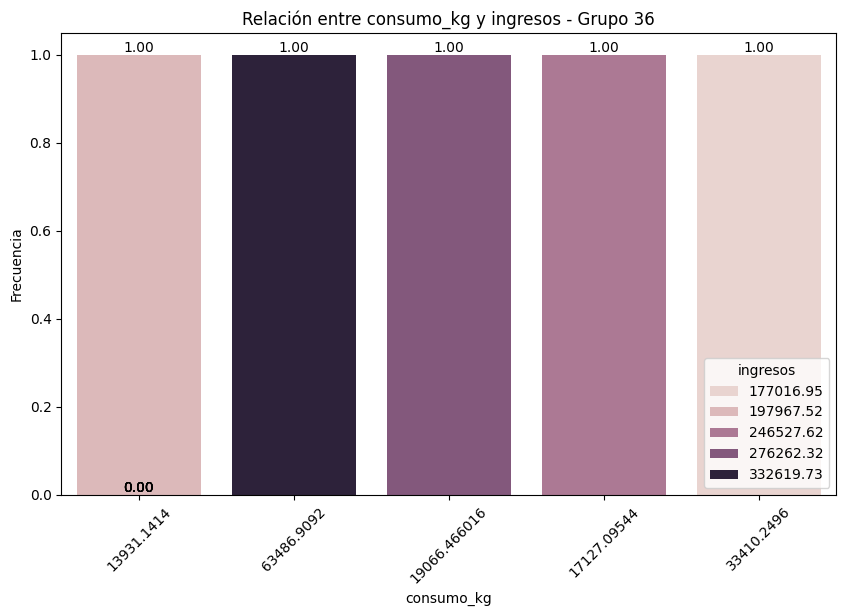

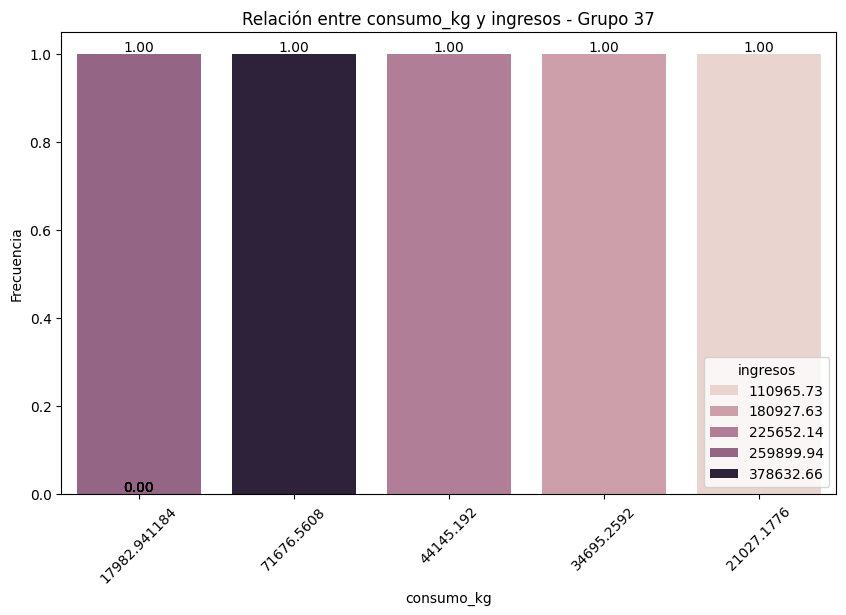

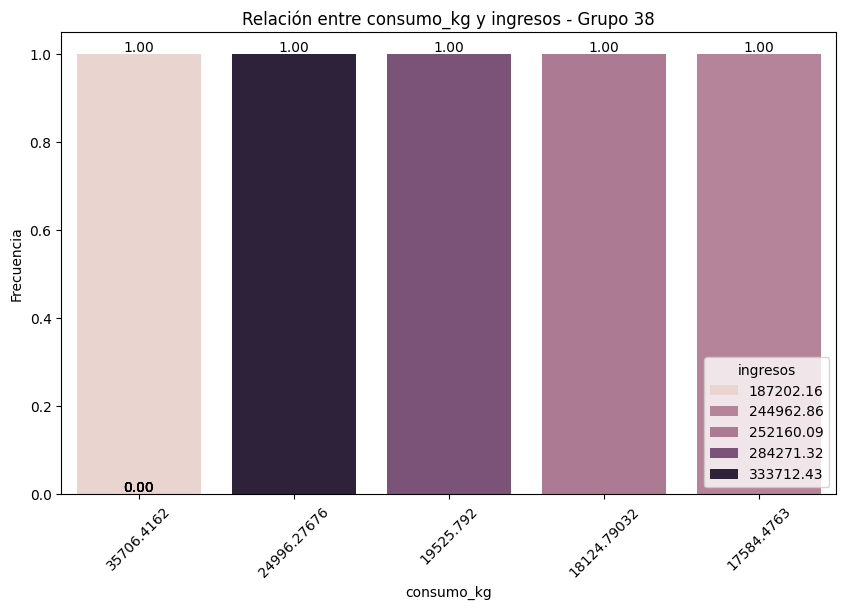

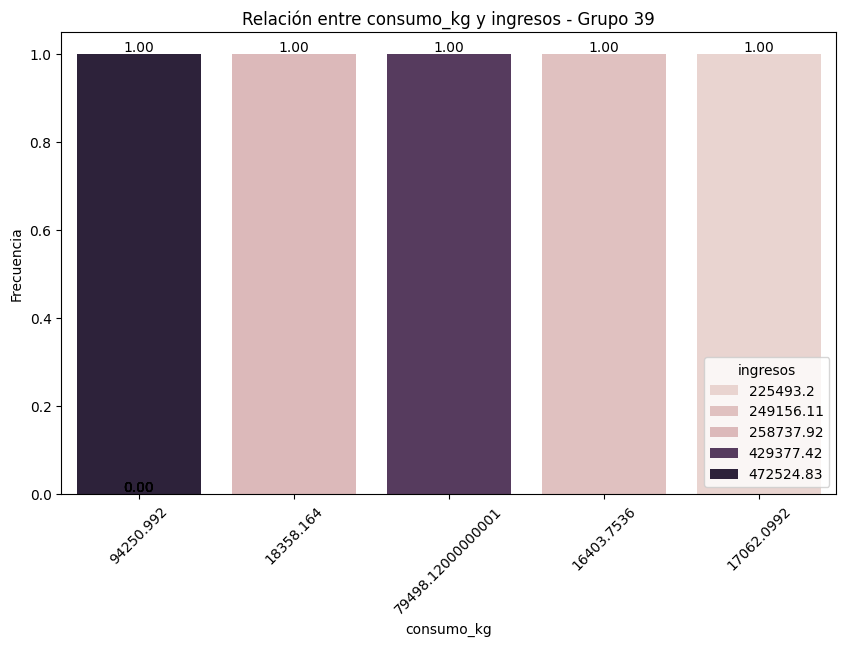

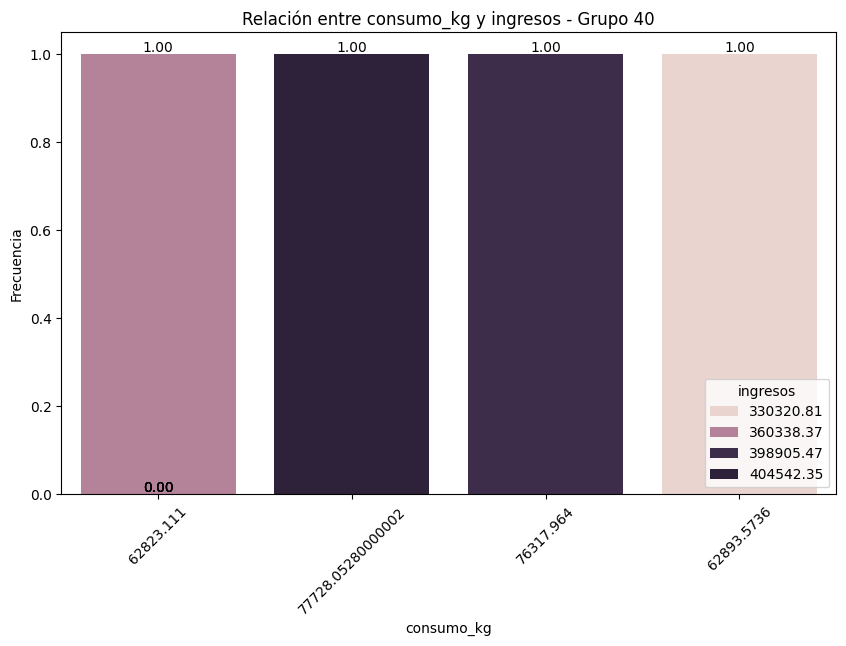

In [77]:
for valor,df_datos in diccionario_multivariante.items():
    print(f"Cat_vuelo {valor}:")
    plot_categorical_relationship_fin(df_datos,col_2,col_1, relative_freq= True, show_values= True)

### Extra:

#1 Consejos para encontrar "objetivos":

Si partes de un dataset que te parece interesante pero sin pregruntras claras, haz como hicimos con el dataset de Aviones. Describe, prioriza a ojo tus variables, realiza un análisis univariante completo, realiza un análisis bivariante ente las parejas de variables que te parecieron más intereantes. Llegados a este punto si el dataset tiene riqueza informativa, algo diferente tiene que haber aparecido (otra cosa es que sea interesante para ti :-)).  

Fíjate en lo que encontramos en el dataset de viajes: la empresa de más vuelos es la que menos ingresos tiene o la existencia clara de una línea de vuelos más eficientes en consumo que otros y otra de mayor ingresos por consumo. Lo siguiente es explorar esos puntos normalmente intentando contestar a: ¿por qué pasa?¿dónde,cuándo o cómo pasa?  

Busca esas "notas discordantes" en tu dataset, ya de por sí son mensajes del análisis. Ordénalas por importancia (importancia = impactan en ingresos, impactan en la calidad de la vida de las personas, impactan en el coste y poco más hay) e intenta entender por qué suceden esas notas discordantes, cómo solucionarlas o aprovecharlas y ya tienes objeetivos para el EDA; incluso si no encuentras respuesta siempre tendras esas notas discordantes, la conclusión de que no se puede avanzar con los datos que se tienen y los próximos pasos de encontrar más información para explicar lo que ocurre.

#2 Contestando a las preguntas de "Viajes".

- Necesitamos identificar esas líneas eficientes, para ello crea una variable que mida el ingreso por kilogramo consumido y otra que mida el kilogramo consumido por kilómetro. Haz el análisis univariante de las mismas intentando encontrar una diferencia clara entre viajes eficientes y no eficientes (que sabemos que existe). Fija un umbral para indicar si un viaje es supereficiente o si no lo es
- Crea esa variable de eficiencia binaria de eficiencia.
- Ahora haz el análisis bivariante de esa eficiencia y las compañías aéreas (queremos ver si realmente eso explica la situación de TabarAir). 
- Para nota: Hacer los análisis multivariante por compañía, eficiencia, tipo de avión y compañía, eficiencia, destino e incluso el de compañía, eficiencia, origen, destino.
- Con todo ello deberías poder encontrar si hay respuesta a la situación de TabarAir además de poder mostrar otros datos interesantes.